In [1]:
import numpy as np
import pandas as pd
from collections import Counter, defaultdict
import re

from nltk.tokenize import word_tokenize, wordpunct_tokenize, RegexpTokenizer

from sklearn.preprocessing import StandardScaler
from sklearn.naive_bayes import MultinomialNB
from scipy.sparse import csr_matrix
from sklearn.decomposition import PCA

from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem.porter import PorterStemmer
from nltk.stem.snowball import SnowballStemmer
from nltk.stem.wordnet import WordNetLemmatizer
from nltk import pos_tag
from sklearn.feature_extraction.text import CountVectorizer, TfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import linear_kernel
import nltk
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')

from keras.models import Sequential
from keras import layers

import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style="darkgrid")
sns.set(font_scale=1.3)



[nltk_data] Downloading package punkt to
[nltk_data]     /Users/josephttustin/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/josephttustin/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     /Users/josephttustin/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
Using TensorFlow backend.


In [2]:
df=pd.read_csv("data/rotten_tomatoes_reviews.csv")
df_quick = df[:10000]
df_quick
doi=df_quick["Review"].values
df_quick


,Freshness,Review
0,1,"Manakamana doesn't answer any questions, yet ..."
1,1,Wilfully offensive and powered by a chest-thu...
2,0,It would be difficult to imagine material mor...
3,0,Despite the gusto its star brings to the role...
4,0,If there was a good idea at the core of this ...
5,0,"Gleeson goes the Hallmark Channel route, dama..."
6,1,It was the height of satire in 1976: dark as ...
7,0,"Everyone in ""The Comedian"" deserves a better ..."
8,0,Actor encourages grumpy Christians to embrace...
9,1,"Slight, contained, but ineffably soulful."


In [4]:
count_vect = CountVectorizer(lowercase=True, tokenizer=None, strip_accents= "ascii", stop_words='english',
                             analyzer='word', max_df=1.0, min_df=3,
                             max_features=10000)
count_vect.fit(df_quick.Review.values)

CountVectorizer(analyzer='word', binary=False, decode_error='strict',
                dtype=<class 'numpy.int64'>, encoding='utf-8', input='content',
                lowercase=True, max_df=1.0, max_features=10000, min_df=3,
                ngram_range=(1, 1), preprocessor=None, stop_words='english',
                strip_accents='ascii', token_pattern='(?u)\\b\\w\\w+\\b',
                tokenizer=None, vocabulary=None)

In [5]:
feature_names = count_vect.get_feature_names()
feature_names

['10',
 '100',
 '11',
 '12',
 '13',
 '1408',
 '15',
 '17th',
 '1940s',
 '1950s',
 '1974',
 '1980',
 '1980s',
 '1984',
 '1985',
 '1988',
 '1990s',
 '1998',
 '20',
 '2001',
 '2002',
 '2003',
 '2005',
 '2007',
 '2008',
 '2009',
 '2010',
 '2011',
 '2012',
 '2013',
 '2014',
 '2015',
 '2016',
 '2017',
 '2049',
 '21',
 '21st',
 '25',
 '27',
 '30',
 '300',
 '33',
 '35',
 '3d',
 '40',
 '40s',
 '45',
 '47',
 '50',
 '50s',
 '60',
 '60s',
 '70',
 '70s',
 '77',
 '79',
 '80',
 '80s',
 '90',
 '90s',
 '95',
 '99',
 'aardman',
 'aaron',
 'abandon',
 'abandoned',
 'ability',
 'able',
 'ably',
 'aboard',
 'abound',
 'abrahamson',
 'abrams',
 'abrasive',
 'absence',
 'absent',
 'absolute',
 'absolutely',
 'absorb',
 'absorbing',
 'abstract',
 'absurd',
 'absurdity',
 'absurdly',
 'abundance',
 'abuse',
 'abysmal',
 'academy',
 'accent',
 'accents',
 'accept',
 'acceptance',
 'access',
 'accessible',
 'accident',
 'acclaim',
 'acclaimed',
 'accompanied',
 'accomplish',
 'accomplished',
 'accomplishment',
 

In [6]:
for key in sorted(count_vect.vocabulary_.keys()):
    print("{0:<20s} {1}".format(key, count_vect.vocabulary_[key]))

10                   0
100                  1
11                   2
12                   3
13                   4
1408                 5
15                   6
17th                 7
1940s                8
1950s                9
1974                 10
1980                 11
1980s                12
1984                 13
1985                 14
1988                 15
1990s                16
1998                 17
20                   18
2001                 19
2002                 20
2003                 21
2005                 22
2007                 23
2008                 24
2009                 25
2010                 26
2011                 27
2012                 28
2013                 29
2014                 30
2015                 31
2016                 32
2017                 33
2049                 34
21                   35
21st                 36
25                   37
27                   38
30                   39
300                  40
33                   41
35

evolves              2231
evolving             2232
ex                   2233
exact                2234
exactly              2235
exaggerated          2236
examination          2237
examine              2238
examines             2239
example              2240
exasperated          2241
exceedingly          2242
exceeds              2243
excellence           2244
excellent            2245
excels               2246
exceptional          2247
exceptionally        2248
excess               2249
excesses             2250
excessive            2251
excessively          2252
excited              2253
excitement           2254
exciting             2255
excruciatingly       2256
excuse               2257
execrable            2258
executed             2259
execution            2260
executive            2261
exercise             2262
exhausted            2263
exhausting           2264
exhaustively         2265
exhibit              2266
exhilarating         2267
exist                2268
existence   

opportunity          4440
opposite             4441
oppressive           4442
optimism             4443
optimistic           4444
opting               4445
opus                 4446
orange               4447
order                4448
ordinary             4449
organization         4450
oriented             4451
origin               4452
original             4453
originality          4454
origins              4455
orson                4456
os                   4457
oscar                4458
oscars               4459
osmosis              4460
ostensibly           4461
ought                4462
ounce                4463
outcome              4464
outer                4465
outing               4466
outlandish           4467
outrage              4468
outrageous           4469
outrageously         4470
outrageousness       4471
outright             4472
outside              4473
outstanding          4474
outtakes             4475
oven                 4476
overacting           4477
overall     

utterly              6850
vacation             6851
vacuous              6852
vacuum               6853
vague                6854
vaguely              6855
valentine            6856
valiant              6857
valley               6858
valuable             6859
value                6860
values               6861
vampire              6862
vampires             6863
van                  6864
vanilla              6865
vanity               6866
vantage              6867
vapid                6868
variant              6869
variation            6870
variations           6871
variety              6872
various              6873
vast                 6874
vaughn               6875
ve                   6876
veer                 6877
veers                6878
vegas                6879
vehicle              6880
vein                 6881
velvet               6882
veneer               6883
vengeance            6884
venom                6885
ventures             6886
verbal               6887
verge       

In [26]:
X_train_counts = count_vect.transform(df_quick["Review"].values)  ##bag of words
print("The type of X_train_counts is {0}.".format(type(X_train_counts)))
print("The X matrix has {0} rows (documents) and {1} columns (words).".format(
        X_train_counts.shape[0], X_train_counts.shape[1]))

scaler = StandardScaler()
X_temp = X_train_counts.toarray()
X_train_std = scaler.fit_transform(X_temp)
X_train_std



The type of X_train_counts is <class 'scipy.sparse.csr.csr_matrix'>.
The X matrix has 10000 rows (documents) and 7217 columns (words).


array([[-0.04816831, -0.03744279, -0.04126615, ..., -0.01732311,
        -0.01732311, -0.01732311],
       [-0.04816831, -0.03744279, -0.04126615, ..., -0.01732311,
        -0.01732311, -0.01732311],
       [-0.04816831, -0.03744279, -0.04126615, ..., -0.01732311,
        -0.01732311, -0.01732311],
       ...,
       [-0.04816831, -0.03744279, -0.04126615, ..., -0.01732311,
        -0.01732311, -0.01732311],
       [-0.04816831, -0.03744279, -0.04126615, ..., -0.01732311,
        -0.01732311, -0.01732311],
       [-0.04816831, -0.03744279, -0.04126615, ..., -0.01732311,
        -0.01732311, -0.01732311]])

In [8]:
count_vect2 = CountVectorizer(lowercase=True, tokenizer=None, ngram_range=(1,2),strip_accents= "ascii", stop_words='english',
                             analyzer='word', max_df=1.0, min_df=1,
                             max_features=None)
count_vect2.fit(df_quick.Review.values)

CountVectorizer(analyzer='word', binary=False, decode_error='strict',
                dtype=<class 'numpy.int64'>, encoding='utf-8', input='content',
                lowercase=True, max_df=1.0, max_features=None, min_df=1,
                ngram_range=(1, 2), preprocessor=None, stop_words='english',
                strip_accents='ascii', token_pattern='(?u)\\b\\w\\w+\\b',
                tokenizer=None, vocabulary=None)

In [9]:
feature_names2 = count_vect.get_feature_names()
len(feature_names2)

7217

In [10]:
for key in sorted(count_vect2.vocabulary_.keys()):
    print("{0:<20s} {1}".format(key, count_vect2.vocabulary_[key]))

000                  0
000 feet             1
007                  2
007 action           3
08                   4
08 east              5
10                   6
10 10                7
10 11                8
10 79                9
10 decades           10
10 especially        11
10 goyas             12
10 lists             13
10 manner            14
10 minutes           15
10 recreates         16
10 times             17
10 year              18
10 years             19
10 yuma              20
100                  21
100 boring           22
100 days             23
100 mins             24
100 minutes          25
100 original         26
100 streets          27
100 year             28
100 years            29
101                  30
101 minutes          31
105                  32
105 minute           33
105 minutes          34
106                  35
106 minutes          36
108                  37
108 minutes          38
11                   39
11 16                40
11 american          41
11

adaptation jones     1989
adaptation lewis     1990
adaptation linda     1991
adaptation livre     1992
adaptation major     1993
adaptation makes     1994
adaptation nicholas  1995
adaptation notre     1996
adaptation novel     1997
adaptation owes      1998
adaptation paula     1999
adaptation plays     2000
adaptation posy      2001
adaptation raymond   2002
adaptation reality   2003
adaptation robert    2004
adaptation schulz    2005
adaptation seething  2006
adaptation smartest  2007
adaptation starts    2008
adaptation stellar   2009
adaptation stephen   2010
adaptation stine     2011
adaptation talky     2012
adaptation telling   2013
adaptation wholesomely 2014
adaptation zola      2015
adaptations          2016
adaptations 20       2017
adaptations bard     2018
adaptations blends   2019
adaptations cousin   2020
adaptations poisoning 2021
adaptations risk     2022
adaptations steven   2023
adaptations thankful 2024
adaptations video    2025
adaptations wrong    2026
adapted  

ankles               4237
anna                 4238
anna foerster        4239
anna friends         4240
anna good            4241
anna karenina        4242
anna kendrick        4243
anna television      4244
anna wintour         4245
annabelle            4246
annabelle bereft     4247
annabelle creation   4248
annabelle creepy     4249
annabelle lot        4250
annals               4251
annals great         4252
annals spectator     4253
annasophia           4254
annasophia robb      4255
anne                 4256
anne fletcher        4257
anne hathaway        4258
annette              4259
annette bening       4260
annie                4261
annie expect         4262
annie hall           4263
annie mumolo         4264
annie shiny          4265
annihilation         4266
annihilation species 4267
anniversary          4268
anniversary events   4269
announcement         4270
announcement aimed   4271
announces            4272
announces group      4273
announces hot        4274
announces ll

ayto                 6691
ayto einai           6692
aytoktonhseis        6693
azazel               6694
azazel jacobs        6695
azema                6696
azema stand          6697
azure                6698
azure seas           6699
babe                 6700
babe pig             6701
babel                6702
babel movie          6703
babes                6704
babes bikinis        6705
babes boobs          6706
babes hotpants       6707
babes sarandon       6708
babies               6709
babies born          6710
babies talk          6711
baby                 6712
baby aspirin         6713
baby birds           6714
baby boomer          6715
baby comedy          6716
baby driver          6717
baby gone            6718
baby joke            6719
baby just            6720
baby making          6721
baby mama            6722
baby oscars          6723
baby pictures        6724
baby redeem          6725
baby requires        6726
baby shows           6727
baby sounds          6728
baby steps  

best transformers    8616
best trash           8617
best trip            8618
best truly           8619
best unsustainable   8620
best viewed          8621
best viewers         8622
best virtual         8623
best way             8624
best wes             8625
best western         8626
best word            8627
best work            8628
best years           8629
best young           8630
besteira             8631
besteira mais        8632
bestow               8633
bestow dignity       8634
bestseller           8635
bestseller source    8636
bet                  8637
bet enjoy            8638
bet fancying         8639
bet kids             8640
bet late             8641
beta                 8642
beta male            8643
betray               8644
betray powerhouse    8645
betray talent        8646
betrayal             8647
betrayal classic     8648
betrayal individuals 8649
betrayals            8650
betrayals fight      8651
betrayed             8652
betrayed family      8653
betrayed for

boyfriends           10690
boyhood              10691
boyhood addiction    10692
boyhood dreams       10693
boyhood paraphrase   10694
boyhood scenes       10695
boyish               10696
boyish twinkle       10697
boyle                10698
boyle clearly        10699
boyle far            10700
boyle film           10701
boyle filmmaking     10702
boyle proprio        10703
boyle providing      10704
boyle work           10705
boys                 10706
boys adventure       10707
boys allen           10708
boys american        10709
boys club            10710
boys cool            10711
boys doesn           10712
boys don             10713
boys features        10714
boys fraction        10715
boys girls           10716
boys hell            10717
boys lighting        10718
boys meets           10719
boys party           10720
boys playground      10721
boys presented       10722
boys rags            10723
boys scenario        10724
boys solid           10725
boys swearing        10726
b

career suicide       12880
career tall          12881
career teaching      12882
career tideland      12883
career wild          12884
career wrecked       12885
careers              12886
careers depended     12887
careers far          12888
carefree             12889
carefree childhood   12890
carefree films       12891
carefree youth       12892
careful              12893
careful avoid        12894
careful calculations 12895
careful deliberate   12896
careful disclosure   12897
careful escalation   12898
careful handiwork    12899
careful inspection   12900
careful listless     12901
careful process      12902
carefully            12903
carefully calculated 12904
carefully considers  12905
carefully constructed 12906
carefully curated    12907
carefully drawn      12908
carefully examine    12909
carefully examines   12910
carefully incorporates 12911
carefully lovingly   12912
carefully measured   12913
carefully thought    12914
carefully timed      12915
careless             1291

cheaply lurid        14845
cheaply portmanteau  14846
cheapness            14847
cheat                14848
cheat diner          14849
cheat process        14850
cheated              14851
cheating             14852
cheating knight      14853
cheats               14854
cheats unpleasantries 14855
check                14856
check attractive     14857
check brain          14858
check especially     14859
check film           14860
check importantly    14861
check sense          14862
check trailer        14863
checkered            14864
checkered careers    14865
checking             14866
checking watch       14867
checking watches     14868
checking wheatley    14869
checklist            14870
checklist films      14871
checklist laughable  14872
checkmate            14873
checkmate machismo   14874
checks               14875
checks original      14876
cheek                14877
cheek audience       14878
cheek episode        14879
cheek sense          14880
cheek tone           14881


cockney geezer       16711
cockney mate         16712
cocktail             16713
cocktail convoluted  16714
cocktail whimsy      16715
cocky                16716
cocky fully          16717
cocky sexuality      16718
coco                 16719
coco amazing         16720
coco endearing       16721
coco visual          16722
cocoa                16723
cocoa rice           16724
cod                  16725
cod set              16726
coda                 16727
coda disappointing   16728
coda russia          16729
coddington           16730
coddling             16731
coddling audience    16732
coddling sexism      16733
code                 16734
code crawling        16735
code easily          16736
code effect          16737
code just            16738
code ozon            16739
code talkers         16740
code tattoo          16741
code trilogy         16742
code words           16743
codger               16744
codger fun           16745
codger renovated     16746
cody                 16747
c

confident luckily    18640
confident robust     18641
confident style      18642
confident technique  18643
confident way        18644
confident witty      18645
confidential         18646
confidential continued 18647
confidently          18648
confidently confidence 18649
confidently escalates 18650
confidently projects 18651
confidently runs     18652
confidently tunefully 18653
confides             18654
confides hacker      18655
confine              18656
confine makes        18657
confined             18658
confined original    18659
confinement          18660
confinement u2026    18661
confines             18662
confines el          18663
confines teahouse    18664
confines toxicity    18665
confirm              18666
confirm fact         18667
confirm need         18668
confirming           18669
confirming realisation 18670
confirms             18671
confirms distaste    18672
confirms perception  18673
conflation           18674
conflation human     18675
conflict            

convincing showcase  19687
convincing somewhat  19688
convincing tedious   19689
convincing think     19690
convincing work      19691
convincing writing   19692
convincingly         19693
convincingly answered 19694
convincingly interestingly 19695
convincingly movies  19696
convincingly nervy   19697
convincingly romantic 19698
convincingly sink    19699
convincingly steely  19700
convoluted           19701
convoluted film      19702
convoluted gripping  19703
convoluted headache  19704
convoluted junky     19705
convoluted limited   19706
convoluted mash      19707
convoluted plot      19708
convoluted production 19709
convoluted progress  19710
convoluted psyche    19711
convoluted scheming  19712
convoluted story     19713
convoluted storytelling 19714
convoluted structure 19715
convoluted tale      19716
convoluted various   19717
convolutions         19718
convulsing           19719
convulsing hours     19720
coogan               19721
coogan bryden        19722
coogan brydon   

craze documentary    20567
craze fantasy        20568
craze screenwriters  20569
crazed               20570
crazed heartbroken   20571
crazed reckless      20572
crazily              20573
crazily charismatic  20574
crazily drain        20575
crazily order        20576
craziness            20577
craziness spawns     20578
craziness strike     20579
crazy                20580
crazy heart          20581
crazy hopeful        20582
crazy horse          20583
crazy kill           20584
crazy little         20585
crazy manic          20586
crazy mel            20587
crazy nights         20588
crazy quilt          20589
crazy rich           20590
crazy romcom         20591
crazy shit           20592
crazy slick          20593
crazy stupid         20594
crazy swing          20595
crazy unbelievably   20596
crazy undeniable     20597
crazy way            20598
crazy world          20599
crazy years          20600
creak                20601
creak adds           20602
creaking             20603
c

damaged              21840
damaged schwarzenegger 21841
damaging             21842
damaging artist      21843
damaging intermittently 21844
dame                 21845
dame judi            21846
dame paris           21847
damian               21848
damian decides       21849
damian times         21850
damien               21851
damien chazelle      21852
damme                21853
damme far            21854
damme makes          21855
damme sight          21856
damme stock          21857
damming              21858
damming mournful     21859
damn                 21860
damn fine            21861
damn good            21862
damn lost            21863
damn near            21864
damn problem         21865
damn thing           21866
damned               21867
damned bad           21868
damned goofy         21869
damning              21870
damning mass         21871
damning say          21872
damon                21873
damon needs          21874
damon perfectly      21875
damon rarely         21

desperation          24185
desperation actor    24186
desperation childhood 24187
desperation clotted  24188
desperation discovering 24189
desperation reynolds 24190
desperation sadness  24191
desperation start    24192
desperation tragedy  24193
despicable           24194
despicable boxes     24195
despicable comes     24196
despicable doubles   24197
despicable facile    24198
despicable likable   24199
despicable modern    24200
despicable sees      24201
despicable shrews    24202
despicable things    24203
despicably           24204
despicably sexist    24205
despise              24206
despise covert       24207
despised             24208
despised reactions   24209
despite              24210
despite abundance    24211
despite apparent     24212
despite appeal       24213
despite based        24214
despite bay          24215
despite beautiful    24216
despite best         24217
despite big          24218
despite boasting     24219
despite boffo        24220
despite casting      242

documented facts     26685
documents            26686
documents french     26687
documents sexual     26688
dodgy                26689
dodgy acting         26690
dodgy points         26691
dodgy storytelling   26692
dodgy wigs           26693
does                 26694
does absolutely      26695
does achieve         26696
does activist        26697
does actually        26698
does adam            26699
does add             26700
does addiction       26701
does adequate        26702
does ambitious       26703
does american        26704
does amusingly       26705
does attempted       26706
does bang            26707
does best            26708
does better          26709
does bit             26710
does bore            26711
does brain           26712
does brilliantly     26713
does burn            26714
does carry           26715
does certain         26716
does cinematic       26717
does cliffhanger     26718
does cohen           26719
does colin           26720
does come            26721
d

earn approval        28880
earn crowds          28881
earn ethos           28882
earn forgiveness     28883
earn rating          28884
earn round           28885
earn sympathy        28886
earn unrelieved      28887
earned               28888
earned january       28889
earned money         28890
earned mutual        28891
earned place         28892
earned right         28893
earnest              28894
earnest cliches      28895
earnest fault        28896
earnest good         28897
earnest indie        28898
earnest leisurely    28899
earnest little       28900
earnest meaning      28901
earnest melodramatic 28902
earnest mood         28903
earnest open         28904
earnest overlong     28905
earnest sporadically 28906
earnest sweetness    28907
earnest terminal     28908
earnest unfocused    28909
earnest unsatisfying 28910
earnest witnessed    28911
earnestly            28912
earnestly acted      28913
earnestly symbolic   28914
earnestness          28915
earnestness handsomely 28916

enemy soon           30729
enemy targets        30730
energetic            30731
energetic animated   30732
energetic earthiness 30733
energetic filmmaking 30734
energetic idealistic 30735
energetic laugh      30736
energetic tantalizing 30737
energetic vibe       30738
energetic yorkshire  30739
energetically        30740
energetically acted  30741
energetically serves 30742
energies             30743
energies peaceful    30744
energised            30745
energised game       30746
energized            30747
energized productions 30748
energizing           30749
energizing film      30750
energizing watch     30751
energy               30752
energy audience      30753
energy black         30754
energy cartoonish    30755
energy courtney      30756
energy creativity    30757
energy cue           30758
energy delight       30759
energy direction     30760
energy dwindles      30761
energy empathy       30762
energy farce         30763
energy film          30764
energy getting       30765

explaining feeling   33313
explaining supremacy 33314
explains             33315
explains jones       33316
explanation          33317
explanation needed   33318
explanation unanswered 33319
explanations         33320
explanations hauntings 33321
explicative          33322
explicative conversations 33323
explicit             33324
explicit grotesquely 33325
explicit implicit    33326
explicit mind        33327
explicit sex         33328
explicit statement   33329
explicit world       33330
explicitly           33331
explicitly religious 33332
explode              33333
explode inside       33334
explode rama         33335
explodes             33336
explodes comic       33337
explodes screen      33338
explodes sense       33339
exploding            33340
exploding heads      33341
exploding knockout   33342
exploding seats      33343
exploding yachts     33344
exploit              33345
exploit current      33346
exploit fears        33347
exploit isolation    33348
exploit themes     

fat index            35172
fat joke             35173
fat kids             35174
fat trim             35175
fat wolverine        35176
fatal                35177
fatal attraction     35178
fatal compromise     35179
fatal distance       35180
fatal flaws          35181
fatal hysteria       35182
fatal lapse          35183
fatal miscalculation 35184
fatal suspense       35185
fatale               35186
fatales              35187
fatales review       35188
fatales serves       35189
fatalistic           35190
fatalistic farce     35191
fatalistic film      35192
fatally              35193
fatally compromised  35194
fatally confused     35195
fatally dull         35196
fatally overlong     35197
fate                 35198
fate coincidences    35199
fate decides         35200
fate engaging        35201
fate furious         35202
fate immortality     35203
fate independence    35204
fate main            35205
fated                35206
fated essentially    35207
fates                35208
f

filmmaking best      37516
filmmaking craft     37517
filmmaking dark      37518
filmmaking debut     37519
filmmaking disney    37520
filmmaking employed  37521
filmmaking entertainment 37522
filmmaking equals    37523
filmmaking gets      37524
filmmaking great     37525
filmmaking high      37526
filmmaking including 37527
filmmaking ineptitude 37528
filmmaking kick      37529
filmmaking licks     37530
filmmaking magicians 37531
filmmaking makes     37532
filmmaking making    37533
filmmaking marked    37534
filmmaking messy     37535
filmmaking monster   37536
filmmaking movie     37537
filmmaking notch     37538
filmmaking painful   37539
filmmaking par       37540
filmmaking pedestrian 37541
filmmaking philosophy 37542
filmmaking poorly    37543
filmmaking process   37544
filmmaking professionals 37545
filmmaking prowess   37546
filmmaking pulls     37547
filmmaking rides     37548
filmmaking right     37549
filmmaking sensitive 37550
filmmaking solid     37551
filmmaking storyt

fresh gatlif         39949
fresh hand           39950
fresh ideas          39951
fresh imaginative    39952
fresh information    39953
fresh ingredients    39954
fresh lease          39955
fresh muscular       39956
fresh new            39957
fresh original       39958
fresh perspective    39959
fresh possible       39960
fresh quirky         39961
fresh rancid         39962
fresh stunt          39963
fresh today          39964
fresh trendy         39965
fresh urgency        39966
fresh visionary      39967
fresh wonder         39968
fresher              39969
fresher funnier      39970
freshest             39971
freshest political   39972
freshly              39973
freshly thought      39974
freshness            39975
freshness factor     39976
freshness novelty    39977
freshness screaming  39978
fresno               39979
fresno narcotic      39980
fretfully            39981
fretfully wrists     39982
fretting             39983
fretting making      39984
freud                39985
f

glossing failings    42473
glossy               42474
glossy appealing     42475
glossy ending        42476
glossy fantasy       42477
glossy girl          42478
glossy gooey         42479
glossy hollywood     42480
glossy lavish        42481
glossy movie         42482
glossy risible       42483
glossy rom           42484
glossy smooth        42485
glove                42486
gloves               42487
gloves double        42488
gloves reduces       42489
gloves umpteen       42490
glow                 42491
glow cornfields      42492
glow cyber           42493
glow enthusiasm      42494
glow high            42495
glower               42496
glower big           42497
glower chicly        42498
glowing              42499
glowing coral        42500
glowing humanity     42501
glowing red          42502
glowingly            42503
glowingly reflected  42504
glows                42505
glows depiction      42506
glows master         42507
gluck                42508
gluck captures       42509
g

hand robert          45032
hand say             45033
hand sick            45034
hand sly             45035
hand spoiled         45036
hand vision          45037
hand wonderful       45038
hand works           45039
handed               45040
handed anti          45041
handed blend         45042
handed charmingly    45043
handed dead          45044
handed director      45045
handed generation    45046
handed group         45047
handed ichi          45048
handed involving     45049
handed just          45050
handed look          45051
handed melodrama     45052
handed message       45053
handed morality      45054
handed nature        45055
handed parody        45056
handed places        45057
handed political     45058
handed structure     45059
handed symbolism     45060
handed traces        45061
handedly             45062
handedly changed     45063
handedly turns       45064
handedness           45065
handedness strip     45066
hander               45067
hander leads         45068
h

hilarity intentional 46887
hilarity kindergarten 46888
hilarity managed     46889
hilarity pun         46890
hilarity strung      46891
hilarity summer      46892
hill                 46893
hill beans           46894
hill capable         46895
hill clarence        46896
hill envisions       46897
hill film            46898
hill just            46899
hill obviously       46900
hill outstanding     46901
hill peter           46902
hill provides        46903
hill pushes          46904
hill scene           46905
hill understated     46906
hillary              46907
hillary clinton      46908
hillcoat             46909
hillcoat cook        46910
hillcoat heist       46911
hillcoat work        46912
hills                46913
hills cop            46914
hills eyes           46915
hills feel           46916
hills seattle        46917
hillsong             46918
hillsong biggest     46919
hindering            46920
hindering empathy    46921
hindi                46922
hindi film           46923


images tired         49254
imaginable           49255
imaginary            49256
imagination          49257
imagination 14       49258
imagination adventure 49259
imagination allows   49260
imagination camera   49261
imagination comic    49262
imagination creativity 49263
imagination demonstrates 49264
imagination discovery 49265
imagination exhilarating 49266
imagination experience 49267
imagination extent   49268
imagination family   49269
imagination genuine  49270
imagination mystery  49271
imagination needed   49272
imagination p2       49273
imagination review   49274
imagination story    49275
imagination technology 49276
imagination thor     49277
imagination timing   49278
imagination worst    49279
imaginative          49280
imaginative effort   49281
imaginative energy   49282
imaginative french   49283
imaginative horrifically 49284
imaginative intelligent 49285
imaginative leaves   49286
imaginative make     49287
imaginative moment   49288
imaginative power    49289
imagi

interplay saccharine 51551
interpret            51552
interpret film       51553
interpretada         51554
interpretada que     51555
interpretan          51556
interpretan el       51557
interpretar          51558
interpretar variacoes 51559
interpretation       51560
interpretation justifies 51561
interpretation powerful 51562
interpretation tale  51563
interpretations      51564
interpretations expound 51565
interpreter          51566
interpreter quite    51567
interpretive         51568
interpretive depth   51569
interrogation        51570
interrogation spiritual 51571
interrogation surveillance 51572
interrogator         51573
interrogator told    51574
interrupt            51575
interrupt eventually 51576
interrupting         51577
interrupting brutality 51578
intersecting         51579
intersecting friction 51580
interspersed         51581
interspersed commentary 51582
interspersed formulaic 51583
interstellar         51584
interstellar grand   51585
intertwines          51586


kai                  53862
kai xiliopathmeno    53863
kai yposthriktikoys  53864
kaiju                53865
kaiju stomping       53866
kail                 53867
kail crew            53868
kaleidoscope         53869
kaleidoscope colour  53870
kaleidoscopic        53871
kaleidoscopic performance 53872
kane                 53873
kane comparisons     53874
kane rashomon        53875
kangaroo             53876
kangaroo jack        53877
kanoyn               53878
kanoyn akrobatika    53879
kanye                53880
kanye west           53881
kapadia              53882
kapadia provides     53883
kapadia undernourished 53884
kapoor               53885
kapoor sons          53886
kapur                53887
kapur 1998           53888
kar                  53889
kar sweetness        53890
karan                53891
karan johar          53892
karaoke              53893
karaoke night        53894
karate               53895
karate themed        53896
karen                53897
karen abercrombie    

lawrence             55947
lawrence act         55948
lawrence arabia      55949
lawrence gonna       55950
lawrence make        55951
lawrence plays       55952
lawrence reunites    55953
lawrence sher        55954
lawrence stars       55955
lawrence stirring    55956
lawrence title       55957
laws                 55958
laws attraction      55959
lawson               55960
lawson needed        55961
lay                  55962
lay blame            55963
lay claim            55964
lay crank            55965
lay dormant          55966
lay strong           55967
layer                55968
layer cake           55969
layer darkness       55970
layer gender         55971
layer layer          55972
layer regret         55973
layered              55974
layered complex      55975
layered psychological 55976
layered pulsatingly  55977
layered subtext      55978
layering             55979
layering gross       55980
layers               55981
layers anger         55982
layers artificial    55983


line remotely        58178
line sand            58179
line scary           58180
line separating      58181
line sexually        58182
line specializes     58183
line stupid          58184
linear               58185
linear approach      58186
linear story         58187
liner                58188
liner dynamic        58189
liners               58190
liners bone          58191
liners flowing       58192
liners make          58193
liners possible      58194
liners unabashed     58195
lines                58196
lines 40             58197
lines aside          58198
lines aspire         58199
lines charlie        58200
lines couple         58201
lines dangerous      58202
lines deftly         58203
lines dialogue       58204
lines direction      58205
lines doesn          58206
lines fact           58207
lines feature        58208
lines feel           58209
lines floods         58210
lines fully          58211
lines good           58212
lines inhabitants    58213
lines like           58214
l

lows associated      60180
loyal                60181
loyal fans           60182
loyalties            60183
loyalties revenge    60184
loyalty              60185
loyalty continued    60186
loyalty doubt        60187
loyalty predecessor  60188
lsd                  60189
lsd jokes            60190
lsd trip             60191
ltimately            60192
ltimately movie      60193
lu                   60194
lu yan               60195
lubezki              60196
lubezki need         60197
luc                  60198
luc besson           60199
luc godard           60200
luca                 60201
luca guadagnino      60202
lucas                60203
lucas days           60204
lucas ilm            60205
lucas original       60206
lucas science        60207
lucas soulless       60208
lucci                60209
luchini              60210
luchini comic        60211
lucid                60212
lucid review         60213
lucimiento           60214
lucimiento que       60215
lucinda              60216
l

mcgonagall           62677
mcgowan              62678
mcgowan act          62679
mcgowan screenwriter 62680
mcgregor             62681
mcgregor good        62682
mcguigan             62683
mcguigan screenwriter 62684
mckay                62685
mckay brought        62686
mckay ferrell        62687
mckay finished       62688
mckay reckless       62689
mckay refusal        62690
mckay strut          62691
mckenzie             62692
mckenzie acting      62693
mckenzie needs       62694
mckinney             62695
mckinney robert      62696
mckinnon             62697
mckinnon character   62698
mckinnon delivers    62699
mckinnon energy      62700
mckinnon fail        62701
mcleod               62702
mcleod performance   62703
mcnamara             62704
mcnamara lessons     62705
mcphee               62706
mcphee affords       62707
mcphee heavy         62708
mcphee holds         62709
mcquarrie            62710
mcquarrie spreads    62711
mcqueen              62712
mcqueen makes        62713


money run            65124
money scowling       65125
money shots          65126
money sit            65127
money sleeps         65128
money special        65129
money stay           65130
money stupid         65131
money tepidly        65132
money wallets        65133
money watch          65134
money went           65135
money world          65136
money worth          65137
moneyball            65138
moneyball ve         65139
mongering            65140
mongering beauty     65141
mongolia             65142
mongolia given       65143
mongoose             65144
mongoose lets        65145
moniker              65146
moniker better       65147
monk                 65148
monk appreciate      65149
monk describes       65150
monk good            65151
monk kar             65152
monkey               65153
monkey enclosure     65154
monkey kingdom       65155
monkey left          65156
monkeys              65157
monkeys jumanji      65158
monkeys rule         65159
monkeys singularly   65160
m

multi                66835
multi cultural       66836
multi generational   66837
multi million        66838
multi oscar          66839
multi plex           66840
multi strand         66841
multicultural        66842
multicultural crash  66843
multifaceted         66844
multifaceted informative 66845
multigenerational    66846
multigenerational stance 66847
multimillion         66848
multimillion dollar  66849
multiplayer          66850
multiplayer console  66851
multiple             66852
multiple instances   66853
multiple oscar       66854
multiple scenes      66855
multiple story       66856
multiple subplots    66857
multiple threads     66858
multiple viewings    66859
multiplex            66860
multiplex don        66861
multiplex filler     66862
multiplex junk       66863
multiplex long       66864
multiplex outlandish 66865
multiplex unfriendly 66866
multiplexes          66867
multiplexes appaloosa 66868
multiplexes does     66869
multiplexes perplexing 66870
multitude        

nos ultimos          68958
nose                 68959
nose actors          68960
nose gold            68961
nose tail            68962
nosedive             68963
nosedive depths      68964
nosedive ll          68965
noses                68966
noses fights         68967
nostalgia            68968
nostalgia blast      68969
nostalgia camps      68970
nostalgia disappointing 68971
nostalgia fest       68972
nostalgia forges     68973
nostalgia lovers     68974
nostalgia situation  68975
nostalgia time       68976
nostalgia trip       68977
nostalgia turns      68978
nostalgia unable     68979
nostalgia watching   68980
nostalgic            68981
nostalgic andy       68982
nostalgic blast      68983
nostalgic charm      68984
nostalgic dreamlike  68985
nostalgic kick       68986
nostril              68987
nostril great        68988
nostril prospecting  68989
nostrils             68990
nostrils giant       68991
notable              68992
notable lack         68993
notable truly        6899

overcomplicated disappointing 71030
overconceptualized   71031
overconceptualized drag 71032
overcooked           71033
overcrowded          71034
overcrowded characters 71035
overcurrent          71036
overcurrent resentment 71037
overdirected         71038
overdirected felt    71039
overdone             71040
overdose             71041
overdose sentimentality 71042
overdoses            71043
overdosing           71044
overdosing cake      71045
overdosing flimsy    71046
overdrive            71047
overdubbed           71048
overdubbed dialogue  71049
overeating           71050
overeating obesity   71051
overed               71052
overed perfume       71053
overemotional        71054
overemotional people 71055
overestimate         71056
overestimate raffish 71057
overextended         71058
overextending        71059
overextending ch     71060
overflows            71061
overflows inventiveness 71062
overflows romance    71063
overgrown            71064
overgrown fratboy    71065
overgr

people think         72889
people trusted       72890
people trying        72891
people understand    72892
people unhappy       72893
people ve            72894
people waging        72895
people want          72896
people watching      72897
people weren         72898
people willing       72899
people won           72900
people wonder        72901
people worked        72902
people world         72903
people written       72904
peppered             72905
peppered cameos      72906
peppered wise        72907
peppermint           72908
peppermint conventional 72909
peppermint good      72910
peppermint soda      72911
peppers              72912
peppers gripping     72913
peppery              72914
peppery entertaining 72915
pepsi                72916
pepsi commercial     72917
pequena              72918
pequena perola       72919
pequenas             72920
pequenas alteraciones 72921
perceived            72922
perceived self       72923
percent              72924
percent hollywood    729

pleasingly           74965
pleasingly acted     74966
pleasingly high      74967
pleasingly intelligent 74968
pleasingly nasty     74969
pleasingly old       74970
pleasingly ostentatious 74971
pleasingly sarcastic 74972
pleasurable          74973
pleasurable moments  74974
pleasurably          74975
pleasurably drifty   74976
pleasure             74977
pleasure beautiful   74978
pleasure derived     74979
pleasure driver      74980
pleasure dumb        74981
pleasure film        74982
pleasure genuinely   74983
pleasure hard        74984
pleasure independent 74985
pleasure lampooning  74986
pleasure lies        74987
pleasure make        74988
pleasure manner      74989
pleasure nuanced     74990
pleasure performance 74991
pleasure person      74992
pleasure reservation 74993
pleasure right       74994
pleasure satisfaction 74995
pleasure sit         74996
pleasure stand       74997
pleasure stayed      74998
pleasure unpack      74999
pleasure watch       75000
pleasure witness     7

prestige             77038
prestige loses       77039
prestige magic       77040
prestige picture     77041
prestige substance   77042
prestige trips       77043
prestigious          77044
prestigious effortless 77045
preston              77046
preston convincing   77047
preston sturges      77048
presumably           77049
presumably attached  77050
presumably cover     77051
presumably labour    77052
presumably like      77053
presumably supposed  77054
presumptuously       77055
presumptuously does  77056
preteen              77057
preteen entertainment 77058
pretence             77059
pretence darkness    77060
pretenciones         77061
pretenciones que     77062
pretend              77063
pretend healthy      77064
pretend like         77065
pretend original     77066
pretending           77067
pretending act       77068
pretending play      77069
pretending sex       77070
pretending treat     77071
pretending wolf      77072
pretends             77073
pretends hungry      7707

quiet place          79219
quiet quaint         79220
quiet reflective     79221
quiet salute         79222
quiet serene         79223
quiet solemnity      79224
quiet soulful        79225
quiet stoical        79226
quiet swamp          79227
quiet triumph        79228
quiet troubling      79229
quieter              79230
quieter white        79231
quietly              79232
quietly absorbing    79233
quietly admire       79234
quietly clever       79235
quietly effective    79236
quietly gripping     79237
quietly infuriating  79238
quietly intense      79239
quietly menacing     79240
quietly methodically 79241
quietly moving       79242
quietly powerful     79243
quietly resplendent  79244
quietly touch        79245
quietly transforms   79246
quietness            79247
quietness times      79248
quilt                79249
quinn                79250
quinn having         79251
quinn jared          79252
quintessential       79253
quintessential new   79254
quintessential second 79255


regard               81280
regard come          81281
regard counterpart   81282
regard democracy     81283
regard makes         81284
regard muppets       81285
regard past          81286
regarded             81287
regarded small       81288
regarding            81289
regarding expression 81290
regarding film       81291
regarding invention  81292
regarding relationship 81293
regarding rights     81294
regarding vantage    81295
regardless           81296
regardless film      81297
regardless outcome   81298
regardless politics  81299
regardless pulling   81300
regardless shortcomings 81301
regardless think     81302
regards              81303
regards composed     81304
reggaeton            81305
reggie               81306
reggie weeks         81307
regimen              81308
reginald             81309
reginald hudlin      81310
reginald hudson      81311
region               81312
region skittish      81313
regional             81314
regional ways        81315
register             81

result exactly       82673
result falling       82674
result fascinating   82675
result feels         82676
result film          82677
result fresh         82678
result going         82679
result gratifying    82680
result hilarious     82681
result immensely     82682
result isn           82683
result just          82684
result lighthearted  82685
result low           82686
result mediocre      82687
result metaphysically 82688
result movie         82689
result nearly        82690
result non           82691
result numbers       82692
result occasionally  82693
result pretty        82694
result relentlessly  82695
result rote          82696
result satisfying    82697
result shocking      82698
result striking      82699
result wasn          82700
resulted             82701
resulted decreased   82702
resulting            82703
resulting disagreeably 82704
resulting disappointing 82705
resulting experience 82706
resulting sloppy     82707
resulting spill      82708
results              8

roy                  84577
roy cohen            84578
roy hill             84579
roy strips           84580
royal                84581
royal history        84582
royal tenenbaums     84583
royale               84584
royale good          84585
royals               84586
royals lush          84587
royalty              84588
royalty elevates     84589
rozema               84590
rozema handling      84591
rozema ruin          84592
rp1                  84593
rp1 perfect          84594
rub                  84595
rub badly            84596
rubbed               84597
rubbed right         84598
rubber               84599
rubber balls         84600
rubber chicken       84601
rubber gloves        84602
rubberfaced          84603
rubberfaced situations 84604
rubbing              84605
rubbing leaf         84606
rubbing mendes       84607
rubbish              84608
rubbish sheer        84609
rubble               84610
rubble cover         84611
rubble strewn        84612
ruben                84613

screenplay makes     86671
screenplay performance 86672
screenplay plummets  86673
screenplay prove     86674
screenplay puts      86675
screenplay quite     86676
screenplay simply    86677
screenplay squanders 86678
screenplay squeezes  86679
screenplay strains   86680
screenplay takes     86681
screenplay tries     86682
screenplay william   86683
screenplay writers   86684
screenplays          86685
screenplays boggles  86686
screenplays sheridan 86687
screens              86688
screens bit          86689
screens compound     86690
screens extreme      86691
screens heart        86692
screens holiday      86693
screens large        86694
screens memorable    86695
screentime           86696
screentime apart     86697
screentime awesome   86698
screenwriter         86699
screenwriter bam     86700
screenwriter bob     86701
screenwriter carole  86702
screenwriter chad    86703
screenwriter charlie 86704
screenwriter cory    86705
screenwriter couldn  86706
screenwriter david   86707

seriously thing      88171
seriously undercuts  88172
seriously yes        88173
seriousness          88174
seriousness protagonists 88175
seriousness respecting 88176
seriousness self     88177
seriousness shepard  88178
serkis               88179
serkis caesar        88180
serkis entrepreneurial 88181
serkis make          88182
sermon               88183
sermon good          88184
sermon need          88185
sermon times         88186
sermonizes           88187
sermonizes directs   88188
sermons              88189
sermons dated        88190
serpent              88191
serpent crafted      88192
serpentine           88193
serpentine plotting  88194
serum                88195
servant              88196
servant roman        88197
servants             88198
servants discussed   88199
serve                88200
serve admirable      88201
serve film           88202
serve images         88203
serve indication     88204
serve little         88205
serve political      88206
serve purpose       

sideways darkly      89751
sideways emotional   89752
sidney               89753
sidney lumet         89754
sidonie              89755
sidonie marie        89756
siege                89757
siege film           89758
siege good           89759
siegel               89760
siegel screenplay    89761
sienna               89762
sienna miller        89763
sift                 89764
sift shifting        89765
sigh                 89766
sigh magic           89767
sight                89768
sight bigger         89769
sight canine         89770
sight delivers       89771
sight dogged         89772
sight fact           89773
sight fans           89774
sight fun            89775
sight gags           89776
sight guess          89777
sight halle          89778
sight makes          89779
sight reading        89780
sight rugged         89781
sight sadder         89782
sight sound          89783
sight story          89784
sight want           89785
sighted              89786
sighted eyes         89787
s

snapshots run        91469
snarks               91470
snarks tony          91471
snarky               91472
snarky air           91473
snarky comedic       91474
snarky rivals        91475
snarky superiority   91476
snatched             91477
snatched feels       91478
snatchers            91479
snatchers ghostbusters 91480
snazzy               91481
snazzy computer      91482
snazzy crafted       91483
snazzy flashbacks    91484
sneak                91485
sneak compelled      91486
sneaker              91487
sneaker commercial   91488
sneaky               91489
sneaky essence       91490
sneaky way           91491
sneer                91492
sneer notion         91493
sneer totally        91494
snickers             91495
snide                91496
snide old            91497
sniff                91498
sniff rears          91499
sniffliest           91500
sniffliest audiences 91501
sniper               91502
sniper problematic   91503
snippet              91504
snippet rockin       91505

staged action        93416
staged better        93417
staged collective    93418
staged fight         93419
staged green         93420
staged like          93421
staged movie         93422
staged open          93423
staged paced         93424
stages               93425
stages excellent     93426
stagey               93427
stagey paper         93428
stagg                93429
stagg young          93430
stagger              93431
stagger collide      93432
stagger humble       93433
staggering           93434
staggering number    93435
staggeringly         93436
staggeringly banal   93437
staggeringly beautiful 93438
staging              93439
staging amy          93440
staging composition  93441
staging lighting     93442
staging variations   93443
stagnant             93444
stagnant atmosphere  93445
stagnates            93446
stagnates null       93447
stagnates stories    93448
stagy                93449
stagy feel           93450
stagy production     93451
staid                93452

stretched pretty     95470
stretched thinner    95471
stretches            95472
stretches aren       95473
stretches dialogue   95474
stretches family     95475
stretches filmmaking 95476
stretches long       95477
stretches monotony   95478
stretches screen     95479
stretches tully      95480
strewn               95481
strewn labyrinth     95482
strictly             95483
strictly ballroom    95484
strictly bearing     95485
strictly chilling    95486
strictly ok          95487
strictly prohibited  95488
strictly remains     95489
strictly soap        95490
strictly true        95491
strides              95492
strides progressiveness 95493
striding             95494
striding corridors   95495
strike               95496
strike 90            95497
strike chord         95498
strike emotional     95499
strike familiar      95500
strike jokey         95501
strike right         95502
strike sparks        95503
strike sun           95504
strike wonder        95505
strikes              9550

tack                 98131
tack question        98132
tacked               98133
tacked disingenuous  98134
tackle               98135
tackle daunting      98136
tackle material      98137
tackles              98138
tackles darker       98139
tackles fantasy      98140
tackles fascinating  98141
tackles feeling      98142
tackles grief        98143
tackles subject      98144
tackling             98145
tackling country     98146
tackling genre       98147
tackling poignant    98148
tackling successfully 98149
tacky                98150
tacky charmless      98151
tacky gilt           98152
tact                 98153
tact grasping        98154
tactic               98155
tactic succeeds      98156
tactical             98157
tactical complexity  98158
tactics              98159
tactics doll         98160
tactics drippy       98161
tactile              98162
tactile languor      98163
tactile textural     98164
tactile warmth       98165
tad                  98166
tad child            98167


thing monsters       100089
thing nhs            100090
thing oceans         100091
thing pastrami       100092
thing pat            100093
thing pixar          100094
thing plodding       100095
thing pointless      100096
thing portrays       100097
thing potentially    100098
thing pun            100099
thing redford        100100
thing right          100101
thing ruined         100102
thing said           100103
thing say            100104
thing says           100105
thing scary          100106
thing seductive      100107
thing sense          100108
thing sequence       100109
thing shows          100110
thing simply         100111
thing sketch         100112
thing somebody       100113
thing standing       100114
thing stepping       100115
thing straight       100116
thing strike         100117
thing suddenly       100118
thing supposed       100119
thing swimming       100120
thing tearing        100121
thing thing          100122
thing thriller       100123
thing titanic       

tourism              102151
tourism commission   102152
tournament           102153
tournament legendary 102154
tournament ve        102155
tournee              102156
tournee mediocre     102157
tout                 102158
tout incoherent      102159
tov                  102160
tov film             102161
tow                  102162
tow clunker          102163
towel                102164
towel open           102165
tower                102166
tower babel          102167
tower better         102168
tower bridge         102169
tower lavish         102170
tower shoot          102171
tower universe       102172
towering             102173
towering achievement 102174
towers               102175
towers satisfying    102176
towers smattering    102177
towing               102178
towing trunk         102179
town                 102180
town america         102181
town american        102182
town bowling         102183
town geek            102184
town girl            102185
town good           

uncompromising experiment 104421
uncompromising funny 104422
uncompromising movie 104423
uncompromising sad   104424
uncompromising siege 104425
uncompromising uningratiating 104426
unconnected          104427
unconnected ideas    104428
unconscious          104429
unconscious digging  104430
unconsciously        104431
unconsciously nasty  104432
uncontrollably       104433
uncontroversial      104434
uncontroversial shouty 104435
unconventional       104436
unconventional biopic 104437
unconventional dynamic 104438
unconventional invasion 104439
unconvincing         104440
unconvincing acting  104441
unconvincing character 104442
unconvincing colonel 104443
unconvincing dancing 104444
unconvincing emotional 104445
unconvincing film    104446
unconvincing finale  104447
unconvincing finally 104448
unconvincing formulaic 104449
unconvincing look    104450
unconvincing love    104451
unconvincing somewhat 104452
unconvincing special 104453
unconvincing step    104454
unconvincing stereo

vibrantly realized   106701
vicariously          106702
vice                 106703
vice closer          106704
vice fused           106705
vice grip            106706
vice little          106707
vice makes           106708
vice president       106709
vice principals      106710
vice takes           106711
vice versa           106712
vicious              106713
vicious aliens       106714
vicious circle       106715
vicious drive        106716
vicious genuinely    106717
vicious lies         106718
vicious nasty        106719
vicious stereotype   106720
viciously            106721
viciously magnetic   106722
vicissitudes         106723
vicissitudes long    106724
victim               106725
victim game          106726
victim hunter        106727
victim instead       106728
victim paying        106729
victim vengeful      106730
victim world         106731
victim writer        106732
victimization        106733
victimization icon   106734
victims              106735
victims audience    

welcome addition     109173
welcome break        109174
welcome crest        109175
welcome departure    109176
welcome deviation    109177
welcome diversion    109178
welcome doesn        109179
welcome dollhouse    109180
welcome dose         109181
welcome fantastic    109182
welcome future       109183
welcome grand        109184
welcome home         109185
welcome innovations  109186
welcome jungle       109187
welcome long         109188
welcome reboot       109189
welcome relief       109190
welcome respite      109191
welcome return       109192
welcome spasms       109193
welcome surprising   109194
welcome throwback    109195
welcome unexpected   109196
welcome worn         109197
welcoming            109198
welcoming actors     109199
welds                109200
welds grisly         109201
welles               109202
welles admired       109203
welles bulky         109204
welles career        109205
welles functioning   109206
welles hitchcock     109207
welles knew         

written alien        111523
written anti         111524
written background   111525
written celine       111526
written charlie      111527
written comedy       111528
written comic        111529
written crayola      111530
written crooked      111531
written dialogue     111532
written directed     111533
written emotional    111534
written forgettable  111535
written herzog       111536
written history      111537
written impeccably   111538
written incredible   111539
written infectiously 111540
written interesting  111541
written like         111542
written little       111543
written moon         111544
written morse        111545
written performed    111546
written played       111547
written pleasingly   111548
written problem      111549
written review       111550
written sam          111551
written scraps       111552
written script       111553
written self         111554
written shot         111555
written story        111556
written sullies      111557
written told        

In [11]:
X_train_counts2 = count_vect2.transform(df_quick["Review"].values)  ##bag of words
print("The type of X_train_counts is {0}.".format(type(X_train_counts)))
print("The X matrix has {0} rows (documents) and {1} columns (words).".format(
        X_train_counts.shape[0], X_train_counts.shape[1]))



The type of X_train_counts is <class 'scipy.sparse.csr.csr_matrix'>.
The X matrix has 10000 rows (documents) and 7217 columns (words).


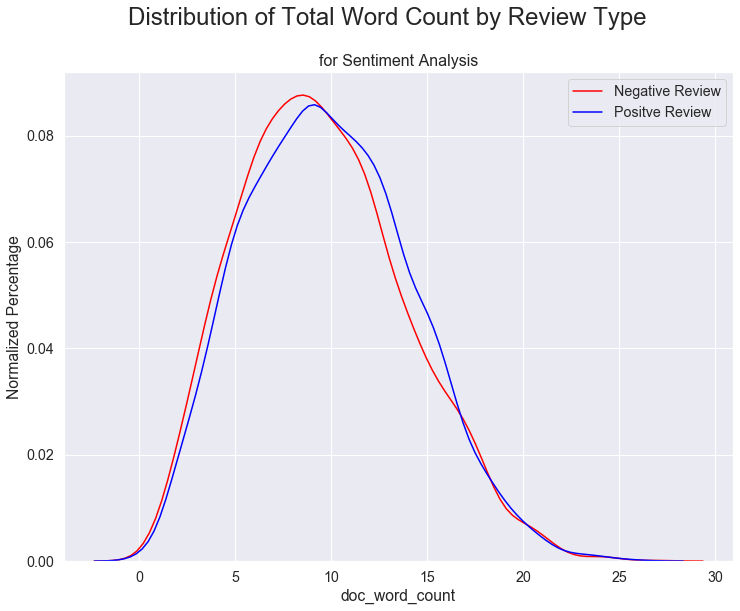

In [13]:
new_df = pd.DataFrame(X_train_counts.toarray(),columns=feature_names)
new_df["doc_word_count"]= new_df.sum(axis=1)
y = df[:10000]["Freshness"]
x_0 = new_df[y==0]["doc_word_count"]
x_1 = new_df[y==1]["doc_word_count"]
fig,ax = plt.subplots(figsize=(12,9))
sns.distplot(x_0, kde=True, color='red', hist = False, label = "Negative Review")
sns.distplot(x_1, kde=True, color='blue', hist = False, label = "Positve Review")
ax.legend()
ax.set_ylabel("Normalized Percentage")
plt.title("for Sentiment Analysis", fontsize =16)
plt.suptitle("Distribution of Total Word Count by Review Type",fontsize=24)
plt.savefig("images/word_count_dist")
plt.show()


In [14]:
new_df.head()

,10,100,11,12,13,1408,15,17th,1940s,1950s,...,zemeckis,zero,zhang,zoe,zombie,zone,zoo,zoolander,zwick,doc_word_count
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,10
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,8
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,5
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,9
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,14


In [9]:
# from sklearn.feature_extraction.text import TfidfTransformer
# # just do term frequency at first, use_idf = False
# tf_transformer = TfidfTransformer(use_idf=False)
# tf_transformer.fit(X_train_counts)
# X_train_tf = tf_transformer.transform(X_train_counts)
# words_doi_tf = X_train_tf[doi]
# print("\nThese are the indices, words, and term frequencies in doc. {0}:".
#        format(doi))
# tf_lst = []
# for i in range(words_doi_tf.count_nonzero()):
#     word_index = words_doi_tf.indices[i]
#     word = count_vect.get_feature_names()[word_index]
#     count = words_doi_tf.data[i]
#     tf_lst.append(count)
#     print("{0:<6d}  {1:<12s}  {2:0.3f}".format(word_index, word, count))

# mag = np.sqrt(np.sum([tf**2 for tf in tf_lst]))
# print("\nThe magnitude of the tf vector for this document is {0:0.3f}".format(mag))
# print("It used the L2 norm.")

In [14]:
tfidf_transformer = TfidfTransformer(use_idf=True)
tfidf_transformer.fit(X_train_counts)
X_train_tfidf = tfidf_transformer.transform(X_train_counts)
# words_doi_tfidf = X_train_tfidf[doi] 
# print("\nThese are the indices, words, and tf-idf values in doc. {0}:".
#       format(doi)) 
# for i in range(words_doi_tfidf.count_nonzero()): 
#     word_index = words_doi_tfidf.indices[i] 
#     word = count_vect.get_feature_names()[word_index]
#     tfidf = words_doi_tfidf.data[i]
#     print("{0:<6d}  {1:<12s}  {2:0.3f}".format(word_index, word, tfidf))
X_train_tfidf.shape

(10000, 20237)

In [11]:
# docs_new = ['God is love', 'OpenGL on the GPU is fast', 
#             'Two hands working can do more than a thousand clasped in prayer.']
# X_new_counts = count_vect.transform(docs_new)
# X_new_tfidf = tfidf_transformer.transform(X_new_counts)
# predictions = nb_model.predict(X_new_tfidf)
# print('Predictions')
# for doc, category in zip(docs_new, predictions):
#     print("{0} => {1}".format(doc, twenty_train.target_names[category]))

In [12]:
# 1. Create a set of documents.
documents = [' '.join(df_quick['Review']).lower() for row in df_quick]
print(documents)

[' manakamana doesn\'t answer any questions, yet makes its point: nepal, like the rest of our planet, is a picturesque but far from peaceable kingdom.  wilfully offensive and powered by a chest-thumping machismo, but it\'s good clean fun.  it would be difficult to imagine material more wrong for spade than lost & found.  despite the gusto its star brings to the role, it\'s hard to ride shotgun on hector\'s voyage of discovery.  if there was a good idea at the core of this film, it\'s been buried in an unsightly pile of flatulence jokes, dog-related bad puns and a ridiculous serial arson plot.  gleeson goes the hallmark channel route, damaging an intermittently curious entry in the time travel subgenre.  it was the height of satire in 1976: dark as hell, but patently absurd and surely nowhere close to objective reality. objective reality surpassed it somewhere in the jerry springer era.  everyone in "the comedian" deserves a better movie than "the comedian."  actor encourages grumpy chr

In [15]:
# 2. Create a set of tokenized documents.
docs = [word_tokenize(content) for content in documents]



In [16]:
# 3. Strip out stop words from each tokenized document.
stop = set(stopwords.words('english'))
docs = [[word for word in words if word not in stop] for words in docs]
docs

[['manakamana',
  "n't",
  'answer',
  'questions',
  ',',
  'yet',
  'makes',
  'point',
  ':',
  'nepal',
  ',',
  'like',
  'rest',
  'planet',
  ',',
  'picturesque',
  'far',
  'peaceable',
  'kingdom',
  '.',
  'wilfully',
  'offensive',
  'powered',
  'chest-thumping',
  'machismo',
  ',',
  "'s",
  'good',
  'clean',
  'fun',
  '.',
  'would',
  'difficult',
  'imagine',
  'material',
  'wrong',
  'spade',
  'lost',
  '&',
  'found',
  '.',
  'despite',
  'gusto',
  'star',
  'brings',
  'role',
  ',',
  "'s",
  'hard',
  'ride',
  'shotgun',
  'hector',
  "'s",
  'voyage',
  'discovery',
  '.',
  'good',
  'idea',
  'core',
  'film',
  ',',
  "'s",
  'buried',
  'unsightly',
  'pile',
  'flatulence',
  'jokes',
  ',',
  'dog-related',
  'bad',
  'puns',
  'ridiculous',
  'serial',
  'arson',
  'plot',
  '.',
  'gleeson',
  'goes',
  'hallmark',
  'channel',
  'route',
  ',',
  'damaging',
  'intermittently',
  'curious',
  'entry',
  'time',
  'travel',
  'subgenre',
  '.',
  

In [17]:
# Stemming / Lemmatization

# 1. Stem using both stemmers and the lemmatizer
porter = PorterStemmer()
snowball = SnowballStemmer('english')
wordnet = WordNetLemmatizer()
docs_porter = [[porter.stem(word) for word in words] for words in docs]
docs_snowball = [[snowball.stem(word) for word in words] for words in docs]
docs_wordnet = [[wordnet.lemmatize(word) for word in words] for words in docs]


In [18]:
for i in range(min(len(docs_porter[0]), len(docs_snowball[0]), len(docs_wordnet[0]))):
    p, s, w = docs_porter[0][i], docs_snowball[0][i], docs_wordnet[0][i]
    if len(set((p, s, w))) != 1:
        print("{}\t{}\t{}\t{}".format(docs[0][i], p, s, w))
p[::]
        


picturesque	picturesqu	picturesqu	picturesque
peaceable	peaceabl	peaceabl	peaceable
wilfully	wil	wil	wilfully
offensive	offens	offens	offensive
powered	power	power	powered
chest-thumping	chest-thump	chest-thump	chest-thumping
imagine	imagin	imagin	imagine
material	materi	materi	material
despite	despit	despit	despite
brings	bring	bring	brings
voyage	voyag	voyag	voyage
discovery	discoveri	discoveri	discovery
buried	buri	buri	buried
unsightly	unsightli	unsight	unsightly
flatulence	flatul	flatul	flatulence
dog-related	dog-rel	dog-rel	dog-related
ridiculous	ridicul	ridicul	ridiculous
goes	goe	goe	go
route	rout	rout	route
damaging	damag	damag	damaging
intermittently	intermitt	intermitt	intermittently
curious	curiou	curious	curious
entry	entri	entri	entry
subgenre	subgenr	subgenr	subgenre
satire	satir	satir	satire
patently	patent	patent	patently
surely	sure	sure	surely
nowhere	nowher	nowher	nowhere
objective	object	object	objective
reality	realiti	realiti	reality
objective	object	object	objec

danse	dans	dans	danse
dance	danc	danc	dance
going	go	go	going
filing	file	file	filing
installment	instal	instal	installment
evidence	evid	evid	evidence
nothing	noth	noth	nothing
noisy	noisi	noisi	noisy
jumbled	jumbl	jumbl	jumbled
sadistic	sadist	sadist	sadistic
thankfully	thank	thank	thankfully
praising	prais	prais	praising
threatened	threaten	threaten	threatened
ended	end	end	ended
really	realli	realli	really
enjoying	enjoy	enjoy	enjoying
looking	look	look	looking
clearly	clearli	clear	clearly
prepared	prepar	prepar	prepared
automotive	automot	automot	automotive
iconography	iconographi	iconographi	iconography
conclusion	conclus	conclus	conclusion
remains	remain	remain	remains
frustratingly	frustratingli	frustrat	frustratingly
middle	middl	middl	middle
dardennes	dardenn	dardenn	dardennes
fashioned	fashion	fashion	fashioned
accessible	access	access	accessible
relatable	relat	relat	relatable
suspense	suspens	suspens	suspense
exposes	expos	expos	expose
miserable	miser	miser	miserable
appe

filmmaker	filmmak	filmmak	filmmaker
crowe	crow	crow	crowe
handful	hand	hand	handful
stories	stori	stori	story
struggling	struggl	struggl	struggling
unifying	unifi	unifi	unifying
nowhere	nowher	nowher	nowhere
advance	advanc	advanc	advance
pretty	pretti	pretti	pretty
dizzying	dizzi	dizzi	dizzying
viewing	view	view	viewing
extricate	extric	extric	extricate
incredible	incred	incred	incredible
circumstance	circumst	circumst	circumstance
existence	exist	exist	existence
witty	witti	witti	witty
sense	sens	sens	sense
wicked	wick	wick	wicked
expense	expens	expens	expense
literary	literari	literari	literary
pretension	pretens	pretens	pretension
egotism	egot	egot	egotism
insecurity	insecur	insecur	insecurity
ill-advised	ill-advis	ill-advis	ill-advised
dalliances	dallianc	dallianc	dalliance
're	're	re	're
looking	look	look	looking
women	women	women	woman
feathered	feather	feather	feathered
assortment	assort	assort	assortment
vintage	vintag	vintag	vintage
sounding	sound	sound	sounding
musical	music	

fantastic	fantast	fantast	fantastic
somewhere	somewher	somewher	somewhere
several	sever	sever	several
compelling	compel	compel	compelling
stories	stori	stori	story
trying	tri	tri	trying
noticed	notic	notic	noticed
sinking	sink	sink	sinking
everything	everyth	everyth	everything
else	els	els	else
magical	magic	magic	magical
especially	especi	especi	especially
dumbledore	dumbledor	dumbledor	dumbledore
calculated	calcul	calcul	calculated
typical	typic	typic	typical
romantic	romant	romant	romantic
comedy	comedi	comedi	comedy
interactions	interact	interact	interaction
myers	myer	myer	myers
everyone	everyon	everyon	everyone
laughed	laugh	laugh	laughed
looking	look	look	looking
however	howev	howev	however
enjoying	enjoy	enjoy	enjoying
careful	care	care	careful
tirelessness	tireless	tireless	tirelessness
beginning	begin	begin	beginning
paintings	paint	paint	painting
appreciate	appreci	appreci	appreciate
someone	someon	someon	someone
haunted	haunt	haunt	haunted
house	hous	hous	house
invigorating

gifted	gift	gift	gifted
phillips	phillip	phillip	phillips
exercise	exercis	exercis	exercise
authority	author	author	authority
producer	produc	produc	producer
misgivings	misgiv	misgiv	misgiving
ignore	ignor	ignor	ignore
straining	strain	strain	straining
lightness	light	light	lightness
watchable	watchabl	watchabl	watchable
hardly	hardli	hard	hardly
anything	anyth	anyth	anything
resembling	resembl	resembl	resembling
tearjerker	tearjerk	tearjerk	tearjerker
boring	bore	bore	boring
hustle	hustl	hustl	hustle
little	littl	littl	little
skilled	skill	skill	skilled
exercise	exercis	exercis	exercise
creative	creativ	creativ	creative
misdirection	misdirect	misdirect	misdirection
quite	quit	quit	quite
delirious	deliri	deliri	delirious
nonsense	nonsens	nonsens	nonsense
disappoints	disappoint	disappoint	disappoints
missed	miss	miss	missed
opportunities	opportun	opportun	opportunity
mixed	mix	mix	mixed
quite	quit	quit	quite
convince	convinc	convinc	convince
kerry	kerri	kerri	kerry
clunkingly	clunkingli

undercooked	undercook	undercook	undercooked
sorely	sore	sore	sorely
lacking	lack	lack	lacking
trimmings	trim	trim	trimming
ready	readi	readi	ready
serve	serv	serv	serve
city	citi	citi	city
angry	angri	angri	angry
affected	affect	affect	affected
compromises	compromis	compromis	compromise
genre	genr	genr	genre
entertaining	entertain	entertain	entertaining
boring	bore	bore	boring
characters	charact	charact	character
aggressiveness	aggress	aggress	aggressiveness
stunning	stun	stun	stunning
piece	piec	piec	piece
'40s	'40	40s	'40s
everybody	everybodi	everybodi	everybody
absorbing	absorb	absorb	absorbing
filled	fill	fill	filled
mesmerizing	mesmer	mesmer	mesmerizing
ambiguity	ambigu	ambigu	ambiguity
indeed	inde	inde	indeed
'straw	'straw	straw	'straw
lurie	luri	luri	lurie
second-rate	second-r	second-r	second-rate
remake	remak	remak	remake
memorable	memor	memor	memorable
controversial	controversi	controversi	controversial
quite	quit	quit	quite
george	georg	georg	george
spending	spend	spend	spend

lycanthropic	lycanthrop	lycanthrop	lycanthropic
ability	abil	abil	ability
outside	outsid	outsid	outside
operating	oper	oper	operating
register	regist	regist	register
defined	defin	defin	defined
safeness	safe	safe	safeness
sturdily	sturdili	sturdili	sturdily
material	materi	materi	material
greatness	great	great	greatness
stylized	styliz	styliz	stylized
slightly	slightli	slight	slightly
perhaps	perhap	perhap	perhaps
overdosing	overdos	overdos	overdosing
flimsy	flimsi	flimsi	flimsy
whimsy	whimsi	whimsi	whimsy
fifty	fifti	fifti	fifty
becomes	becom	becom	becomes
painfully	pain	pain	painfully
basically	basic	basic	basically
together	togeth	togeth	together
sixty	sixti	sixti	sixty
damned	damn	damn	damned
extremely	extrem	extrem	extremely
offensive	offens	offens	offensive
consistently	consist	consist	consistently
wicked	wick	wick	wicked
conscience	conscienc	conscienc	conscience
really	realli	realli	really
billy	billi	billi	billy
achy	achi	achi	achy
breaky	breaki	breaki	breaky
brooding	brood	bro

history	histori	histori	history
likely	like	like	likely
baffle	baffl	baffl	baffle
novices	novic	novic	novice
feeling	feel	feel	feeling
curiously	curious	curious	curiously
unmoved	unmov	unmov	unmoved
slightly	slightli	slight	slightly
resentful	resent	resent	resentful
amazing	amaz	amaz	amazing
story	stori	stori	story
movingly	movingli	move	movingly
sentimentality	sentiment	sentiment	sentimentality
movies	movi	movi	movie
fine-tuned	fine-tun	fine-tun	fine-tuned
engaged	engag	engag	engaged
fascinating	fascin	fascin	fascinating
addressed	address	address	addressed
openly	openli	open	openly
characters	charact	charact	character
platonic	platon	platon	platonic
playful	play	play	playful
90s	90	90s	90
indie	indi	indi	indie
breaking	break	break	breaking
goes	goe	goe	go
evokes	evok	evok	evokes
visceral	viscer	viscer	visceral
sense	sens	sens	sense
jubilation	jubil	jubil	jubilation
immediately	immedi	immedi	immediately
connects	connect	connect	connects
us	us	us	u
movie	movi	movi	movie
setting	set	set	

office	offic	offic	office
asked	ask	ask	asked
terrible	terribl	terribl	terrible
luis	lui	lui	luis
cheerfully	cheer	cheer	cheerfully
satire	satir	satir	satire
repression	repress	repress	repression
erotic	erot	erot	erotic
fantasies	fantasi	fantasi	fantasy
running	run	run	running
saying	say	say	saying
genuinely	genuin	genuin	genuinely
unexpected	unexpect	unexpect	unexpected
purely	pure	pure	purely
irrelevance	irrelev	irrelev	irrelevance
landis	landi	landi	landis
macabre	macabr	macabr	macabre
enlightenment	enlighten	enlighten	enlightenment
starring	star	star	starring
andy	andi	andi	andy
serkis	serki	serki	serkis
entrepreneurial	entrepreneuri	entrepreneuri	entrepreneurial
furthering	further	further	furthering
cause	caus	caus	cause
science	scienc	scienc	science
goes	goe	goe	go
'worst	'worst	worst	'worst
quite	quit	quit	quite
possibly	possibl	possibl	possibly
unfortunately	unfortun	unfortun	unfortunately
story	stori	stori	story
seductive	seduct	seduct	seductive
manipulated	manipul	manipul	man

frontlines	frontlin	frontlin	frontlines
anyone	anyon	anyon	anyone
viability	viabil	viabil	viability
traditional	tradit	tradit	traditional
newsgathering	newsgath	newsgath	newsgathering
remains	remain	remain	remains
pressing	press	press	pressing
significance	signific	signific	significance
torture	tortur	tortur	torture
another	anoth	anoth	another
sacrificing	sacrif	sacrif	sacrificing
nuanced	nuanc	nuanc	nuanced
storytelling	storytel	storytel	storytelling
force	forc	forc	force
reducing	reduc	reduc	reducing
everyone	everyon	everyon	everyone
caricature	caricatur	caricatur	caricature
essentially	essenti	essenti	essentially
episode	episod	episod	episode
authentic	authent	authent	authentic
enlightening	enlighten	enlighten	enlightening
documentary	documentari	documentari	documentary
visually	visual	visual	visually
breathtaking	breathtak	breathtak	breathtaking
presenting	present	present	presenting
awe-inspiring	awe-inspir	awe-inspir	awe-inspiring
juxtaposed	juxtapos	juxtapos	juxtaposed
many	mani	

memorable	memor	memor	memorable
images	imag	imag	image
clarity	clariti	clariti	clarity
together	togeth	togeth	together
people	peopl	peopl	people
restaurants	restaur	restaur	restaurant
messy	messi	messi	messy
payne	payn	payn	payne
captures	captur	captur	capture
locations	locat	locat	location
honesty	honesti	honesti	honesty
enchanting	enchant	enchant	enchanting
irritating	irrit	irrit	irritating
juvenile	juvenil	juvenil	juvenile
oddly	oddli	odd	oddly
endearing	endear	endear	endearing
powerful	power	power	powerful
testimony	testimoni	testimoni	testimony
changes	chang	chang	change
people	peopl	peopl	people
voices	voic	voic	voice
pleasantly	pleasantli	pleasant	pleasantly
90-minute	90-minut	90-minut	90-minute
probably	probabl	probabl	probably
russell	russel	russel	russell
adapted	adapt	adapt	adapted
story	stori	stori	story
engaging	engag	engag	engaging
believable	believ	believ	believable
characters	charact	charact	character
meta-slasher	meta-slash	meta-slash	meta-slasher
toying	toy	toy	toying

waiting	wait	wait	waiting
revelations	revel	revel	revelation
really	realli	realli	really
going	go	go	going
exacerbated	exacerb	exacerb	exacerbated
artificiality	artifici	artifici	artificiality
everything	everyth	everyth	everything
sappy	sappi	sappi	sappy
romantic	romant	romant	romantic
fantasy	fantasi	fantasi	fantasy
proves	prove	prove	prof
movie	movi	movi	movie
based	base	base	based
inordinately	inordin	inordin	inordinately
little	littl	littl	little
romantic	romant	romant	romantic
chemistry	chemistri	chemistri	chemistry
're	're	re	're
female	femal	femal	female
absolutely	absolut	absolut	absolutely
nothing	noth	noth	nothing
conclusion	conclus	conclus	conclusion
likely	like	like	likely
beloved	belov	belov	beloved
anime	anim	anim	anime
movie	movi	movi	movie
struggle	struggl	struggl	struggle
unfolds	unfold	unfold	unfolds
predictable	predict	predict	predictable
nasty	nasti	nasti	nasty
technically	technic	technic	technically
polished	polish	polish	polished
tiresome	tiresom	tiresom	tiresome


unbelievable	unbeliev	unbeliev	unbelievable
story	stori	stori	story
believably	believ	believ	believably
everly	everli	ever	everly
abruptly	abruptli	abrupt	abruptly
'll	'll	ll	'll
fixed	fix	fix	fixed
messy	messi	messi	messy
movie	movi	movi	movie
charismatic	charismat	charismat	charismatic
earpiece	earpiec	earpiec	earpiece
calling	call	call	calling
movie	movi	movi	movie
force	forc	forc	force
effective	effect	effect	effective
comedic	comed	comed	comedic
less	less	less	le
compelling	compel	compel	compelling
examination	examin	examin	examination
aging	age	age	aging
fractured	fractur	fractur	fractured
family	famili	famili	family
dynamics	dynam	dynam	dynamic
funny	funni	funni	funny
romantic	romant	romant	romantic
comedy	comedi	comedi	comedy
despite	despit	despit	despite
predictable	predict	predict	predictable
stereotypes	stereotyp	stereotyp	stereotype
chemistry	chemistri	chemistri	chemistry
typical	typic	typic	typical
opposites	opposit	opposit	opposite
disjointed	disjoint	disjoint	disjointed


asks	ask	ask	asks
dizzying	dizzi	dizzi	dizzying
ferocious	feroci	feroci	ferocious
emotional	emot	emot	emotional
celebration	celebr	celebr	celebration
trailblazers	trailblaz	trailblaz	trailblazer
demanded	demand	demand	demanded
pic-a-nic	pic-a-n	pic-a-n	pic-a-nic
many	mani	mani	many
experience	experi	experi	experience
obvious	obviou	obvious	obvious
black-ops	black-op	black-op	black-ops
many	mani	mani	many
tricky	tricki	tricki	tricky
undercurrents	undercurr	undercurr	undercurrent
manage	manag	manag	manage
caved	cave	cave	caved
predictable	predict	predict	predictable
directions	direct	direct	direction
navigate	navig	navig	navigate
poetry	poetri	poetri	poetry
snarks	snark	snark	snarks
tony	toni	toni	tony
edition	edit	edit	edition
thanks	thank	thank	thanks
maturity	matur	matur	maturity
depicted	depict	depict	depicted
dignity	digniti	digniti	dignity
extemporaneous-seeming	extemporaneous-seem	extemporaneous-seem	extemporaneous-seeming
behavioral	behavior	behavior	behavioral
rarely	rare	rare	r

taste	tast	tast	taste
relied	reli	reli	relied
less	less	less	le
predictably	predict	predict	predictably
crudely	crude	crude	crudely
predictable	predict	predict	predictable
single	singl	singl	single
component	compon	compon	component
entirely	entir	entir	entirely
tedious	tediou	tedious	tedious
exercise	exercis	exercis	exercise
including	includ	includ	including
furious	furiou	furious	furious
spectacle	spectacl	spectacl	spectacle
overwhelming	overwhelm	overwhelm	overwhelming
two-dimensional	two-dimension	two-dimension	two-dimensional
characters	charact	charact	character
inconsistencies	inconsist	inconsist	inconsistency
overall	overal	overal	overall
stupidity	stupid	stupid	stupidity
'transformers	'transform	transform	'transformers
extinction	extinct	extinct	extinction
available	avail	avail	available
impossible	imposs	imposs	impossible
seduced	seduc	seduc	seduced
hard-edged	hard-edg	hard-edg	hard-edged
teenage	teenag	teenag	teenage
seeking	seek	seek	seeking
pleased	pleas	pleas	pleased
cutsie

sullenberger	sullenberg	sullenberg	sullenberger
another	anoth	anoth	another
milestone	mileston	mileston	milestone
story	stori	stori	story
story	stori	stori	story
plus	plu	plus	plus
minutes	minut	minut	minute
seraphine	seraphin	seraphin	seraphine
sympathetic	sympathet	sympathet	sympathetic
focus	focu	focus	focus
laborer	labor	labor	laborer
refined	refin	refin	refined
execution	execut	execut	execution
tribute	tribut	tribut	tribute
long-running	long-run	long-run	long-running
fairly	fairli	fair	fairly
character	charact	charact	character
realised	realis	realis	realised
balance	balanc	balanc	balance
talky	talki	talki	talky
leisurely	leisur	leisur	leisurely
baseball	basebal	basebal	baseball
appropriate	appropri	appropri	appropriate
uncannily	uncannili	uncannili	uncannily
evoke	evok	evok	evoke
feelings	feel	feel	feeling
awkwardness	awkward	awkward	awkwardness
alienation	alien	alien	alienation
excitement	excit	excit	excitement
teenager	teenag	teenag	teenager
conjures	conjur	conjur	conjures
susp

freudenthal	freudenth	freudenth	freudenthal
moving	move	move	moving
many	mani	mani	many
parental	parent	parent	parental
available	avail	avail	available
expecting	expect	expect	expecting
something	someth	someth	something
musical	music	music	musical
trilogy	trilog	trilog	trilogy
hungry	hungri	hungri	hungry
cinematic	cinemat	cinemat	cinematic
tradition	tradit	tradit	tradition
joyfully	joy	joy	joyfully
resurrected	resurrect	resurrect	resurrected
shocking	shock	shock	shocking
depressing	depress	depress	depressing
sensibilities	sensibl	sensibl	sensibility
memory	memori	memori	memory
devastating	devast	devast	devastating
beautifully	beauti	beauti	beautifully
residents	resid	resid	resident
represented	repres	repres	represented
story	stori	stori	story
dimensions	dimens	dimens	dimension
leaning	lean	lean	leaning
study	studi	studi	study
seeing	see	see	seeing
subordinating	subordin	subordin	subordinating
creating	creat	creat	creating
nature	natur	natur	nature
movie	movi	movi	movie
everything	every

idiosyncratic	idiosyncrat	idiosyncrat	idiosyncratic
qualities	qualiti	qualiti	quality
amis	ami	ami	amis
becomes	becom	becom	becomes
badly	badli	bad	badly
dated	date	date	dated
movie	movi	movi	movie
entire	entir	entir	entire
meticulously	meticul	meticul	meticulously
calibrated	calibr	calibr	calibrated
ambiguity	ambigu	ambigu	ambiguity
encouraging	encourag	encourag	encouraging
assumptions	assumpt	assumpt	assumption
characters	charact	charact	character
audience	audienc	audienc	audience
fully	fulli	fulli	fully
verify	verifi	verifi	verify
profoundly	profoundli	profound	profoundly
enraging	enrag	enrag	enraging
potentially	potenti	potenti	potentially
galvanizing	galvan	galvan	galvanizing
important	import	import	important
pieces	piec	piec	piece
nonfiction	nonfict	nonfict	nonfiction
mystery	mysteri	mysteri	mystery
science	scienc	scienc	science
existed	exist	exist	existed
despite	despit	despit	despite
interesting	interest	interest	interesting
degenerates	degener	degener	degenerate
obvious	obviou

continued	continu	continu	continued
family	famili	famili	family
togetherness	togeth	togeth	togetherness
casting	cast	cast	casting
turning	turn	turn	turning
original	origin	origin	original
comedies	comedi	comedi	comedy
considers	consid	consid	considers
something	someth	someth	something
less	less	less	le
romantic	romant	romant	romantic
enabler	enabl	enabl	enabler
presented	present	present	presented
probably	probabl	probabl	probably
conservative	conserv	conserv	conservative
heading	head	head	heading
aged	age	age	aged
recycled	recycl	recycl	recycled
sometimes	sometim	sometim	sometimes
register	regist	regist	register
tepidly	tepidli	tepid	tepidly
cause	caus	caus	cause
watching	watch	watch	watching
movie	movi	movi	movie
rarely	rare	rare	rarely
thinking	think	think	thinking
provokes	provok	provok	provokes
engage	engag	engag	engage
regularly	regularli	regular	regularly
perhaps	perhap	perhap	perhaps
familiarity	familiar	familiar	familiarity
bloodthirsty	bloodthirsti	bloodthirsti	bloodthirsty
ha

children	children	children	child
inhabitants	inhabit	inhabit	inhabitant
caretakers	caretak	caretak	caretaker
suppose	suppos	suppos	suppose
insurance-company	insurance-compani	insurance-compani	insurance-company
audition	audit	audit	audition
covered	cover	cover	covered
jones	jone	jone	jones
filled	fill	fill	filled
interesting	interest	interest	interesting
examine	examin	examin	examine
study	studi	studi	study
failure	failur	failur	failure
ultimately	ultim	ultim	ultimately
fascinating	fascin	fascin	fascinating
sometimes	sometim	sometim	sometimes
exhilarating	exhilar	exhilar	exhilarating
movie	movi	movi	movie
seems	seem	seem	seems
genuine	genuin	genuin	genuine
us	us	us	u
educational	educ	educ	educational
struggling	struggl	struggl	struggling
managing	manag	manag	managing
survive	surviv	surviv	survive
uninspired	uninspir	uninspir	uninspired
recycled	recycl	recycl	recycled
danny	danni	danni	danny
suggests	suggest	suggest	suggests
dramatic	dramat	dramat	dramatic
salinger	saling	saling	salinge

bastante	bastant	bastant	bastante
emily	emili	emili	emily
..family	..famili	..famili	..family
entertainment	entertain	entertain	entertainment
sense	sens	sens	sense
something	someth	someth	something
something	someth	someth	something
endure	endur	endur	endure
movie	movi	movi	movie
tangled	tangl	tangl	tangled
overstuffed	overstuf	overstuf	overstuffed
thinly-sketched	thinly-sketch	thinly-sketch	thinly-sketched
history	histori	histori	history
unlike	unlik	unlik	unlike
dollar-making	dollar-mak	dollar-mak	dollar-making
trouble	troubl	troubl	trouble
decadence	decad	decad	decadence
simply	simpli	simpli	simply
depressingly	depressingli	depress	depressingly
degeneratively	degen	degen	degeneratively
decadent	decad	decad	decadent
superficial	superfici	superfici	superficial
melodramatic	melodramat	melodramat	melodramatic
pleasure	pleasur	pleasur	pleasure
delivers-giving	delivers-giv	delivers-giv	delivers-giving
soulful	soul	soul	soulful
kindhearted	kindheart	kindheart	kindhearted
performance	perform

pieces	piec	piec	piece
occasionally-too-flashy	occasionally-too-flashi	occasionally-too-flashi	occasionally-too-flashy
otherwise	otherwis	otherwis	otherwise
pleasingly	pleasingli	pleas	pleasingly
twisted	twist	twist	twisted
loyalties	loyalti	loyalti	loyalty
revenge	reveng	reveng	revenge
bloody	bloodi	bloodi	bloody
redemption	redempt	redempt	redemption
disaster	disast	disast	disaster
community	commun	communiti	community
imagined	imagin	imagin	imagined
visually	visual	visual	visually
sumptuous	sumptuou	sumptuous	sumptuous
narrative	narr	narrat	narrative
cliffhanger	cliffhang	cliffhang	cliffhanger
ending	end	end	ending
indicate	indic	indic	indicate
everyone	everyon	everyon	everyone
involved	involv	involv	involved
series	seri	seri	series
going	go	go	going
seeping	seep	seep	seeping
consciousness	conscious	conscious	consciousness
lingering	linger	linger	lingering
really	realli	realli	really
getting	get	get	getting
flawed	flaw	flaw	flawed
value	valu	valu	value
delivers	deliv	deliv	delivers
me

filmmaker	filmmak	filmmak	filmmaker
clearly	clearli	clear	clearly
production	product	product	production
involved	involv	involv	involved
exactly	exactli	exact	exactly
movie	movi	movi	movie
remains	remain	remain	remains
fantasy	fantasi	fantasi	fantasy
enjoyable	enjoy	enjoy	enjoyable
direction	direct	direct	direction
try	tri	tri	try
denaturalize	denatur	denatur	denaturalize
ordinary	ordinari	ordinari	ordinary
lived	live	live	lived
nothing	noth	noth	nothing
everyone	everyon	everyon	everyone
unpleasant	unpleas	unpleas	unpleasant
mean-spirited	mean-spirit	mean-spirit	mean-spirited
movie	movi	movi	movie
becomes	becom	becom	becomes
repetitive	repetit	repetit	repetitive
pretty	pretti	pretti	pretty
quickly	quickli	quick	quickly
characters	charact	charact	character
lovable	lovabl	lovabl	lovable
detestable	detest	detest	detestable
're	're	re	're
lovable	lovabl	lovabl	lovable
detestable	detest	detest	detestable
defined	defin	defin	defined
minimal	minim	minim	minimal
endlessly	endlessli	endless	endl

emotion	emot	emot	emotion
watching	watch	watch	watching
story	stori	stori	story
non-traditional	non-tradit	non-tradit	non-traditional
family	famili	famili	family
trying	tri	tri	trying
together	togeth	togeth	together
disappears	disappear	disappear	disappears
'at	'at	at	'at
movie	movi	movi	movie
advertising	advertis	advertis	advertising
lying	lie	lie	lying
wonderful	wonder	wonder	wonderful
movie	movi	movi	movie
louis	loui	loui	louis
dreyfus	dreyfu	dreyfus	dreyfus
terrific	terrif	terrif	terrific
together	togeth	togeth	together
shriveled	shrivel	shrivel	shriveled
little	littl	littl	little
attention	attent	attent	attention
direction	direct	direct	direction
adaptation	adapt	adapt	adaptation
helped	help	help	helped
little	littl	littl	little
developed	develop	develop	developed
compelling	compel	compel	compelling
confounding	confound	confound	confounding
measure	measur	measur	measure
inelegant	ineleg	ineleg	inelegant
movie	movi	movi	movie
cyrus	cyru	cyrus	cyrus
performance	perform	perform	perfo

seriously	serious	serious	seriously
pageantry	pageantri	pageantri	pageantry
affecting	affect	affect	affecting
narrative	narr	narrat	narrative
despite	despit	despit	despite
sophistication	sophist	sophist	sophistication
performance	perform	perform	performance
escaping	escap	escap	escaping
remake	remak	remak	remake
trying	tri	tri	trying
convince	convinc	convinc	convince
forged	forg	forg	forged
called	call	call	called
movies	movi	movi	movie
addicted	addict	addict	addicted
making	make	make	making
value	valu	valu	value
watching	watch	watch	watching
expensive	expens	expens	expensive
disaster	disast	disast	disaster
slowly	slowli	slowli	slowly
odds	odd	odd	odds
lofty	lofti	lofti	lofty
ultimately	ultim	ultim	ultimately
compellingly	compellingli	compel	compellingly
series	seri	seri	series
based	base	base	based
impulse	impuls	impuls	impulse
slightly	slightli	slight	slightly
redeemed	redeem	redeem	redeemed
christmas	christma	christma	christmas
cheese	chees	chees	cheese
glory	glori	glori	glory
count

entertaining	entertain	entertain	entertaining
reminder	remind	remind	reminder
people	peopl	peopl	people
sometimes	sometim	sometim	sometimes
living	live	live	living
universe	univers	univers	universe
adventure	adventur	adventur	adventure
endure	endur	endur	endure
fully	fulli	fulli	fully
realized	realiz	realiz	realized
thanks	thank	thank	thanks
intelligence	intellig	intellig	intelligence
initial	initi	initi	initial
teasing	teas	teas	teasing
flirty	flirti	flirti	flirty
quality	qualiti	qualiti	quality
become	becom	becom	become
insufferably	insuffer	insuffer	insufferably
cloying	cloy	cloy	cloying
middle	middl	middl	middle
rendition	rendit	rendit	rendition
national	nation	nation	national
ceremony	ceremoni	ceremoni	ceremony
less	less	less	le
badly	badli	bad	badly
needle	needl	needl	needle
subtlety	subtleti	subtleti	subtlety
old-fashioned	old-fashion	old-fashion	old-fashioned
beautifully	beauti	beauti	beautifully
crafted	craft	craft	crafted
nature	natur	natur	nature
documentary	documentari	docu

watching	watch	watch	watching
impressive	impress	impress	impressive
performances	perform	perform	performance
've	've	ve	've
something	someth	someth	something
experimental	experiment	experiment	experimental
beautiful	beauti	beauti	beautiful
shortcomings	shortcom	shortcom	shortcoming
derivative	deriv	deriv	derivative
leanings	lean	lean	leaning
unique	uniqu	uniqu	unique
experience	experi	experi	experience
recycling	recycl	recycl	recycling
less	less	less	le
healing	heal	heal	healing
befall	befal	befal	befall
us	us	us	u
quite	quit	quit	quite
pretty	pretti	pretti	pretty
perhaps	perhap	perhap	perhaps
auteurists	auteurist	auteurist	auteurists
able	abl	abl	able
figure	figur	figur	figure
cinematic	cinemat	cinemat	cinematic
oeuvre	oeuvr	oeuvr	oeuvre
linklater	linklat	linklat	linklater
admirable	admir	admir	admirable
taking	take	take	taking
seriously	serious	serious	seriously
gruelling	gruell	gruell	gruelling
pitched	pitch	pitch	pitched
dead-eyed	dead-ey	dead-ey	dead-eyed
graduates	graduat	graduat

original	origin	origin	original
movie	movi	movi	movie
many	mani	mani	many
embarrassing	embarrass	embarrass	embarrassing
otherwise	otherwis	otherwis	otherwise
talented	talent	talent	talented
sexy	sexi	sexi	sexy
50-and-over	50-and-ov	50-and-ov	50-and-over
'ant-man	'ant-man	ant-man	'ant-man
typical	typic	typic	typical
sensory	sensori	sensori	sensory
taking	take	take	taking
introducing	introduc	introduc	introducing
stable	stabl	stabl	stable
superheroes	superhero	superhero	superheroes
intermittent	intermitt	intermitt	intermittent
pleasures	pleasur	pleasur	pleasure
nanny	nanni	nanni	nanny
affords	afford	afford	affords
provided	provid	provid	provided
chiefly	chiefli	chiefli	chiefly
passable	passabl	passabl	passable
destination	destin	destin	destination
family	famili	famili	family
square	squar	squar	square
contains	contain	contain	contains
many	mani	mani	many
pleasures	pleasur	pleasur	pleasure
single	singl	singl	single
extraordinary	extraordinari	extraordinari	extraordinary
always	alway	alway	

movie	movi	movi	movie
monotonous	monoton	monoton	monotonous
truly	truli	truli	truly
remarkable	remark	remark	remarkable
naivete	naivet	naivet	naivete
sophistication	sophist	sophist	sophistication
movie	movi	movi	movie
performance	perform	perform	performance
already	alreadi	alreadi	already
going	go	go	going
remembered	rememb	rememb	remembered
movie	movi	movi	movie
etched	etch	etch	etched
permanent	perman	perman	permanent
wonderfully	wonder	wonder	wonderfully
well-matched	well-match	well-match	well-matched
genre	genr	genr	genre
cinematic	cinemat	cinemat	cinematic
've	've	ve	've
starving	starv	starv	starving
'men	'men	men	'men
seemed	seem	seem	seemed
running	run	run	running
empty	empti	empti	empty
embodiment	embodi	embodi	embodiment
everything	everyth	everyth	everything
whereas	wherea	wherea	whereas
completely	complet	complet	completely
intriguing	intrigu	intrigu	intriguing
movie	movi	movi	movie
basis	basi	basi	basis
regrettably	regrett	regrett	regrettably
serious	seriou	serious	serious
c

nicolas	nicola	nicola	nicolas
taste	tast	tast	taste
elliptical	ellipt	ellipt	elliptical
storytelling	storytel	storytel	storytelling
interplanetary	interplanetari	interplanetari	interplanetary
tragedy	tragedi	tragedi	tragedy
arriving	arriv	arriv	arriving
something	someth	someth	something
nevins	nevin	nevin	nevins
nihilistic	nihilist	nihilist	nihilistic
fostered	foster	foster	fostered
nurturing	nurtur	nurtur	nurturing
family	famili	famili	family
resonates	reson	reson	resonates
rebels-with-a-cause	rebels-with-a-caus	rebels-with-a-caus	rebels-with-a-cause
novelty	novelti	novelti	novelty
post-production	post-product	post-product	post-production
preferable	prefer	prefer	preferable
seemed	seem	seem	seemed
capable	capabl	capabl	capable
audacious	audaci	audaci	audacious
rupture	ruptur	ruptur	rupture
suggests	suggest	suggest	suggests
shiny	shini	shini	shiny
by-the-numbers	by-the-numb	by-the-numb	by-the-numbers
less	less	less	le
energy	energi	energi	energy
piece-filled	piece-fil	piece-fil	piece-f

'.'

In [19]:
# Bag of words and TF-IDF

# 1. Create vocab, set of unique words
docs = docs_snowball # choose which stemmer/lemmatizer to use
vocab_set = set()
[[vocab_set.add(token) for token in tokens] for tokens in docs]
vocab = list(vocab_set)
vocab

# 2. Create word count vectors manually.
matrix = [[0] * len(vocab) for doc in docs]
vocab_dict = dict((word, i) for i, word in enumerate(vocab))
for i, words in enumerate(df.Review.values):
    for word in words:
        matrix[i][vocab_dict[word]] += 1


# 3. Create word count vector over the whole corpus.
cv = CountVectorizer(stop_words='english')
vectorized = cv.fit_transform(matrix)


# tfidf = TfidfTransformer(use_idf=True)
# tfidfed = tfidf.fit_transform(documents)
# print(tfidfed)
#X_matrix =tfidfed.todense()
#type(X_matrix)
#X_array = tfidfed.toarray()
#X_array
#X_array
# ans=np.asarray(X_matrix)
# len(ans)
print(vectorized)


KeyError: ' '

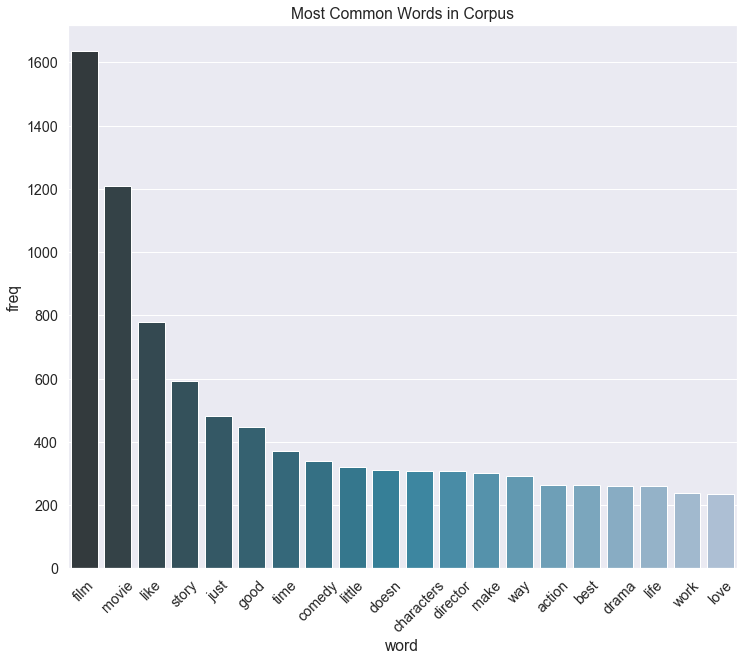

In [15]:
#cv = CountVectorizer()
#bow = cv.fit_transform(sr_clean)
word_freq = dict(zip(count_vect.get_feature_names(), np.asarray(X_train_counts.sum(axis=0)).ravel()))
word_counter = Counter(word_freq)
word_counter_df = pd.DataFrame(word_counter.most_common(20), columns = ['word', 'freq'])
fig, ax = plt.subplots(figsize=(12, 10))
sns.barplot(x="word", y="freq", data=word_counter_df, palette="PuBuGn_d", ax=ax)
plt.xticks(rotation=45)
plt.title("Most Common Words in Corpus")
plt.savefig("images/most_common_words")
plt.show();

In [16]:
print('\nTraining a Naive Bayes model.')
nb_model = MultinomialNB(alpha=1.0, fit_prior=True, class_prior=None)
y=df_quick["Freshness"].values
# print(y.shape)
# print(X_train_counts.shape)
X_train_counts_arr = X_train_counts.toarray()
print(X_train_counts_arr.shape)
nb_model.fit(X_train_counts_arr, y)
type(X_train_counts_arr)


Training a Naive Bayes model.
(10000, 7217)


numpy.ndarray

In [17]:
df_test = df[40000:41000]
X_test = df_test["Review"].values
X_test_counts = count_vect.transform(X_test)
X_test_arr = X_test_counts.toarray()
#print(X_test_arr.shape)
#X_test_std= scaler.fit_transform(X_temp)
y_test = df_test["Freshness"].values
#print(X_test_counts.shape)
print(X_test_arr.shape)

(1000, 7217)


In [18]:
nb_model.score(X_test_arr, y_test)

0.719

In [69]:
df_quick.values
transformer = TfidfTransformer()
X_train_tfidf = transformer.fit_transform(X_train_counts)
X_train_tfidf_arr = X_train_tfidf.toarray()
X_train_tfidf_arr.shape
y.shape,y_test.shape
X_test_tfidf = transformer.fit_transform(X_test_counts)
X_test_tfidf_arr = X_test_tfidf.toarray()
X_test_tfidf_arr.shape

(1000, 20208)

In [72]:
print('\nTraining a Naive Bayes model.')
nb_model_tfidf = MultinomialNB(alpha=1.0, fit_prior=True, class_prior=None)
y=df_quick["Freshness"].values
print(y.shape)
print(X_train_counts.shape)
nb_model_tfidf.fit(X_train_tfidf_arr, y)


Training a Naive Bayes model.
(10000,)
(10000, 20208)


MultinomialNB(alpha=1.0, class_prior=None, fit_prior=True)

In [73]:
nb_model_tfidf.score(X_test_tfidf_arr, y_test)

0.729

In [19]:
input_dim = X_train_counts.shape[1]  # Number of features
model = Sequential()
model.add(layers.Dense(10, input_dim=input_dim, activation='relu'))
model.add(layers.Dense(1, activation='sigmoid'))

Instructions for updating:
Colocations handled automatically by placer.


In [20]:
model.compile(optimizer="adam",loss='binary_crossentropy', 
                metrics=['accuracy'])
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1 (Dense)              (None, 10)                72180     
_________________________________________________________________
dense_2 (Dense)              (None, 1)                 11        
Total params: 72,191
Trainable params: 72,191
Non-trainable params: 0
_________________________________________________________________


In [21]:
print(X_train_counts_arr.shape)
print(y.shape)
print(X_test_arr.shape)
print(y_test.shape)
history = model.fit(X_train_counts_arr, y,
                      epochs=10,
                      verbose=True,
                      validation_data=(X_test_arr, y_test),
                      batch_size=30)

(10000, 7217)
(10000,)
(1000, 7217)
(1000,)
Instructions for updating:
Use tf.cast instead.
Train on 10000 samples, validate on 1000 samples
Epoch 1/10
10000/10000 [==============================] - 5s 494us/step - loss: 0.6387 - acc: 0.6639 - val_loss: 0.5805 - val_acc: 0.7200
Epoch 2/10
10000/10000 [==============================] - 3s 301us/step - loss: 0.4688 - acc: 0.8063 - val_loss: 0.5430 - val_acc: 0.7210
Epoch 3/10
10000/10000 [==============================] - 3s 311us/step - loss: 0.3605 - acc: 0.8522 - val_loss: 0.5500 - val_acc: 0.7270
Epoch 4/10
10000/10000 [==============================] - 3s 304us/step - loss: 0.2919 - acc: 0.8847 - val_loss: 0.5730 - val_acc: 0.7220
Epoch 5/10
10000/10000 [==============================] - 3s 317us/step - loss: 0.2422 - acc: 0.9092 - val_loss: 0.5989 - val_acc: 0.7250
Epoch 6/10
10000/10000 [==============================] - 3s 309us/step - loss: 0.2019 - acc: 0.9306 - val_loss: 0.6431 - val_acc: 0.7230
Epoch 7/10
10000/10000 [=======

In [22]:
loss, accuracy = model.evaluate(X_train_counts_arr, y, verbose=True)
print("Training Accuracy: {:.4f}".format(accuracy))
loss, accuracy = model.evaluate(X_test_arr, y_test, verbose=False)
print("Testing Accuracy:  {:.4f}".format(accuracy))


10000/10000 [==============================] - 1s 67us/step
Training Accuracy: 0.9841
Testing Accuracy:  0.7200


In [23]:
def plot_history(history):
    acc = history.history['acc']
    val_acc = history.history['val_acc']
    loss = history.history['loss']
    val_loss = history.history['val_loss']
    x = range(1, len(acc) + 1)

    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1)
    plt.plot(x, acc, 'b', label='Training acc')
    plt.plot(x, val_acc, 'r', label='Validation acc')
    plt.title('Training and validation accuracy')
    plt.legend()
    plt.subplot(1, 2, 2)
    plt.plot(x, loss, 'b', label='Training loss')
    plt.plot(x, val_loss, 'r', label='Validation loss')
    plt.suptitle("Neural Network model",fontsize=24)
    plt.title('Training and validation loss')
    plt.legend()

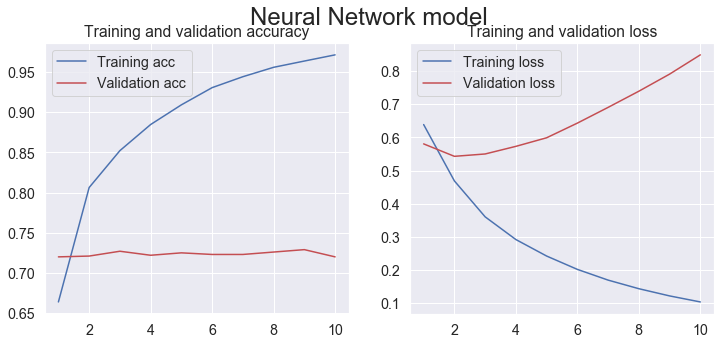

In [24]:
plot_history(history)

In [27]:
X_train_std.shape

(10000, 7217)

In [ ]:
X_train_std[:,0].std()

In [28]:
# standardize data : use X_train_std

pca = PCA(n_components=1000) #pca object
X_pca = pca.fit_transform(X_train_std) # from 5000 features to 30 PCA features

print("\nData after PCA into 2 components")
print("PC1\tPC2")
for i in range(50):
    print("{0:0.1f}\t{1:0.1f}".format(X_pca[i,0], X_pca[i,1]))
X_pca.shape
pca.components_
#X_train_std.shape


Data after PCA into 2 components
PC1	PC2
0.1	-0.1
0.1	-0.1
-0.0	0.1
-0.1	-0.1
-0.5	-0.3
2.2	-0.8
0.6	-0.7
0.2	-0.1
0.3	-0.1
-0.0	-0.0
-0.0	-1.2
0.2	-0.2
-0.1	-0.1
-1.0	-0.3
-0.0	-0.1
0.3	0.8
-0.2	-0.1
-0.2	-0.4
-0.0	-0.0
0.0	-0.1
-0.6	0.9
-0.1	-0.3
-0.3	-0.2
-1.1	-1.3
-0.2	-0.1
-0.4	-0.6
0.7	-0.3
-0.4	-0.2
0.0	-0.3
0.0	-0.6
-1.0	-0.4
-0.7	0.1
-0.1	-0.2
-0.2	0.7
-0.1	-0.3
0.5	-0.4
-0.1	0.3
-0.6	-0.3
-0.2	-0.1
-0.2	-0.6
-0.3	-0.9
-0.3	-0.3
-0.2	-0.6
0.0	-0.2
0.2	-0.2
-0.1	-0.0
-0.4	-0.4
-0.7	0.2
-0.4	0.4
-0.6	-0.4


array([[-5.46262795e-03, -2.19650212e-03,  2.50209329e-03, ...,
        -1.57107844e-03,  5.96373675e-04, -1.63823405e-03],
       [ 3.99061335e-03,  6.39637462e-05, -7.49724720e-04, ...,
        -1.93604839e-03, -3.63326039e-04, -1.17570603e-03],
       [-1.90412277e-03, -9.87823848e-04,  7.17155490e-03, ...,
        -2.56344847e-03, -1.09380316e-03,  1.00476808e-03],
       ...,
       [ 5.85844396e-03,  6.82478033e-03, -1.32805213e-02, ...,
        -2.14643999e-03,  5.12086383e-03,  9.15647670e-04],
       [-2.15252057e-03, -9.48648521e-03, -2.35379485e-03, ...,
         6.68765656e-03,  2.63703201e-02, -8.50433591e-03],
       [ 4.38621985e-03, -3.87374810e-03, -6.80597972e-03, ...,
        -1.84186407e-02,  2.64249861e-02,  5.12210181e-03]])

In [ ]:
# components= pca.components_
# max_pca1 = components.argsort(desc)[:10]



(10000,)

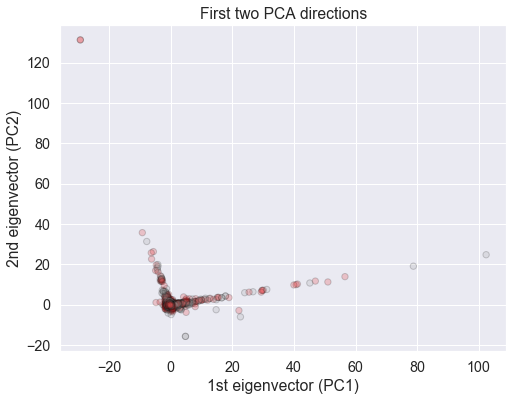

In [29]:
fig, ax = plt.subplots(1, 1, figsize=(8, 6))
ax.scatter(X_pca[:, 0], X_pca[:, 1], c=y,
           cmap=plt.cm.Set1, edgecolor='k', s=40, alpha=0.2)
ax.set_title("First two PCA directions")
ax.set_xlabel("1st eigenvector (PC1)")
ax.set_ylabel("2nd eigenvector (PC2)");
X_pca[:,1].shape

In [30]:
evr = pca.explained_variance_ratio_
print(sum(evr))
print(evr)
top_pca_evr = np.argsort(evr)[::-1]
print(evr[top_pca_evr][:5])
total_variance = np.sum(pca.explained_variance_)
cum_variance_of_2 = np.sum(pca.explained_variance_[0:2])
prop_var_expl_2 = cum_variance_of_2/total_variance
print(prop_var_expl_2)
print("The 2 principal components explain {0:0.1f}%"
      " of the variance in the original data.".format(prop_var_expl_2*100))

0.37969059854164483
[0.00069402 0.00068339 0.00067587 0.00064846 0.00061974 0.00060842
 0.00060681 0.00059932 0.0005885  0.00058504 0.00058462 0.00058331
 0.00057986 0.00057693 0.00057426 0.00057014 0.00056915 0.00056702
 0.00056691 0.00056267 0.00055848 0.00055698 0.00055556 0.00055443
 0.00055219 0.00055    0.00054989 0.00054804 0.00054671 0.00054368
 0.00054316 0.00054267 0.00053998 0.00053879 0.00053773 0.00053639
 0.00053463 0.00053417 0.00053242 0.00053177 0.00053124 0.0005305
 0.00052895 0.00052771 0.00052691 0.00052534 0.00052477 0.0005237
 0.00052319 0.00052147 0.00052122 0.00052084 0.00051944 0.00051939
 0.00051783 0.00051658 0.0005159  0.00051559 0.00051509 0.0005147
 0.00051387 0.00051325 0.00051198 0.00051129 0.00051055 0.00051031
 0.00050979 0.0005086  0.00050825 0.00050725 0.00050694 0.00050588
 0.00050548 0.00050488 0.00050411 0.000504   0.00050351 0.00050231
 0.00050149 0.00050076 0.00050048 0.00050027 0.00049921 0.00049893
 0.00049852 0.00049762 0.00049659 0.00049599 

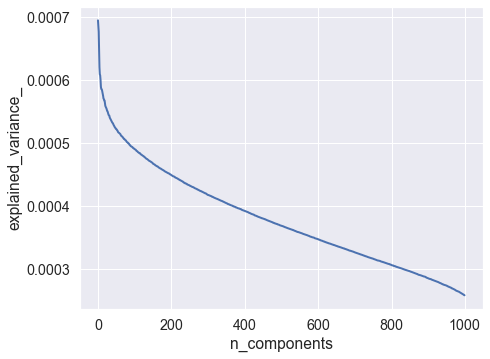

In [31]:
pca.fit(X_train_std)

plt.figure(1, figsize=(8, 6))
plt.clf()
plt.axes([.2, .2, .7, .7])
num_components = pca.n_components_
ind = np.arange(num_components)
plt.plot(pca.explained_variance_ratio_, linewidth=2)
plt.axis('tight')
plt.xlabel('n_components')
plt.ylabel('explained_variance_');

In [ ]:
pca.explained_variance_ratio_

[0.00362815]


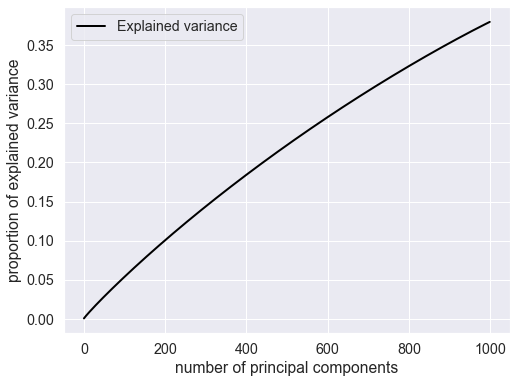

In [32]:
total_variance = np.sum(pca.explained_variance_)
cum_variance = np.cumsum(pca.explained_variance_)
prop_var_expl = cum_variance/total_variance
fig, ax = plt.subplots(figsize=(8,6))
ax.plot(pca.explained_variance_ratio_.cumsum(), color = 'black', linewidth=2, label='Explained variance')
#ax.axhline(0.9, label='90% goal', linestyle='--', linewidth=1)
ax.set_ylabel('proportion of explained variance')
ax.set_xlabel('number of principal components')
ax.legend();
print(prop_var_expl[1:2])

In [ ]:
def plot_rt_embedding(ax, X, y, title=None):
     """Plot an embedding of the mnist dataset onto a plane.
 
     Parameters
     ----------
     ax: matplotlib.axis object
       The axis to make the scree plot on.
 
     X: numpy.array, shape (n, 2)
       A two dimensional array containing the coordinates of the embedding.
 
     y: numpy.array
       The labels of the datapoints.  Should be digits.
 
     title: str
       A title for the plot.
     """
     x_min, x_max = np.min(X, 0), np.max(X, 0)
     X = (X - x_min) / (x_max - x_min)
     ax.axis('off')
     ax.patch.set_visible(False)
     for i in range(X.shape[0]):
         plt.text(X[i, 0], X[i, 1], 
                  str(y[i]), 
                  color=plt.cm.Set1(y[i]), 
                  fontdict={'weight': 'bold', 'size': 12})
 
     ax.set_xticks([]), 
     ax.set_yticks([])
     ax.set_ylim([-0.1,1.1])
     ax.set_xlim([-0.1,1.1])
 
     if title is not None:
         ax.set_title(title, fontsize=16)
            
    

In [ ]:
X_pca = pca.fit_transform(X_train_std)
fig , ax = plt.subplots()
plot_rt_embedding(ax, X_pca, y, title=None)
#X_pca.shape
     

In [156]:
count_vect2 = CountVectorizer(lowercase=True, tokenizer=None, stop_words='english',
                             analyzer='word', ngram_range=(1,3), max_df=1.0, min_df=1,
                             max_features=None)
X_train_counts2 = count_vect2.fit_transform(df_quick.Review.values)
X_train_counts2_arr = X_train_counts2.toarray()
X_train_counts2_arr.shape

(10000, 204500)

In [157]:
feature_names = count_vect2.get_feature_names()
feature_names

['000',
 '000 feet',
 '000 feet orbit',
 '007',
 '007 action',
 '007 action featuring',
 '08',
 '08 east',
 '08 east bucharest',
 '10',
 '10 10',
 '10 11',
 '10 11 year',
 '10 79',
 '10 79 type',
 '10 decades',
 '10 decades know',
 '10 especially',
 '10 especially girls',
 '10 goyas',
 '10 goyas spain',
 '10 lists',
 '10 lists standard',
 '10 manner',
 '10 manner simply',
 '10 minutes',
 '10 minutes director',
 '10 minutes dragged',
 '10 minutes film',
 '10 minutes long',
 '10 minutes old',
 '10 recreates',
 '10 recreates gradual',
 '10 times',
 '10 year',
 '10 year buildup',
 '10 year old',
 '10 years',
 '10 years ago',
 '10 years later',
 '10 yuma',
 '10 yuma generate',
 '10 yuma makes',
 '100',
 '100 boring',
 '100 days',
 '100 days solitude',
 '100 mins',
 '100 mins overplayed',
 '100 minutes',
 '100 minutes movie',
 '100 minutes nonstop',
 '100 minutes offline',
 '100 minutes shoot',
 '100 original',
 '100 original work',
 '100 streets',
 '100 streets used',
 '100 year',
 '100 yea

In [158]:
print('\nTraining a Naive Bayes model.')
nb_model2 = MultinomialNB(alpha=1.0, fit_prior=True, class_prior=None)
y=df_quick["Freshness"].values
nb_model2.fit(X_train_counts2_arr, y)


Training a Naive Bayes model.


MultinomialNB(alpha=1.0, class_prior=None, fit_prior=True)

In [159]:
df_test = df[40000:41000]
X_test = df_test["Review"].values
X_test_counts = count_vect2.transform(X_test)
print(X_test_counts.shape)
X_test_counts_arr = X_test_counts.toarray()
print(X_test_counts_arr.shape)
# X_test_counts_arr = X_test_counts.toarray()
# X_test_counts_arr.shape
# #X_test_std= scaler.fit_transform(X_temp)
y_test = df_test["Freshness"].values
print(y_test.shape)
# X_test_count_arr.shape

(1000, 204500)
(1000, 204500)
(1000,)


In [160]:
nb_model2.score(X_test_counts_arr, y_test)

0.725